# Intro

## Best Fit
We want to learn a hypothesis that fits the future data best. To make that precise we need a __stationary assumption__ to define “future data” and “best.” We make the stationarity assumption: that there is a probability distribution over examples that remains stationary over time.

Assumptions are called to be independent and identically distributed, connecting the past to the future/ without some such connection, all
bets are off—the future could be anything.

We define the error rate of a hypothesis as the proportion of mistakes it makes — the proportion of times that h(x) != y for an (x, y) example. Now, just because a hypothesis h has a low error rate on the training set does not mean that it will generalize well. 

### Overfitting
Happens when the model is too complex relative to the amount and noisiness of the training data.

A general phenomenon, overfitting occurs with all types of learners, even when the target function is not at all random. Overfitting becomes more likely as the
hypothesis space and the number of input attributes grows, and less likely as we increase the number of training examples  (RUSSEL and NORVIG, XXX, p.713). .
***
1. Simplify the model by selecting one with fewer parameters (e.g., a linear model rather than a high-degree polynomial model), by reducing the number of attributes in the training data, or by constraining the model.
2. Gather more training data.
3. Reduce the noise in the training data (e.g., fix data errors and remove outliers).

### Regularization
Constraining a model to make it simpler and reduce the risk of overfitting is called regularization. 

The process of explicitly penalizing complex hypotheses is called regularization (because it looks for a function that is more regular, or less complex). The choice of regularization function depends on the hypothesis space. (RUSSEL and NORVIG, XXX, p.713). 

The amount of regularization to apply during learning can be controlled by a hyper‐
parameter. 

### Underfitting
The opposite of overfitting: it occurs when your model is too simple to learn the underlying structure of the data. For example, a linear model of life satisfaction is prone to underfit; reality is just more complex than the model, so its predictions are bound to be inaccurate, even on the training examples.
***
1. Select a more powerful model, with more parameters;
2. Feed better features to the learning algorithm (feature engineering).;
3. Reduce the constraints on the model (e.g., reduce the regularization hyperparameter).

It is common to use 80% of the data for training and hold out 20%
for testing. However, this depends on the size of the dataset: if it
contains 10 million instances, then holding out 1% means your test
set will contain 100,000 instances, probably more than enough to
get a good estimate of the generalization error.

### Holdout validation

You simply hold out part of the training set to evaluate several candidate models and select the best one. The new held-out set is called the __validation set__ (or sometimes the development set, or dev set). More specifically, you train multiple models with various hyperparameters on the reduced training set (i.e., the full training set minus the validation set), and you select the model that performs best on the validation set. After this __holdout validation process__, you train the best model on the full training set (including the validation set), and this gives you the final model. Lastly, you evaluate this final model on the test set to get an estimate of the generalization error.

If the validation set is too small, then model evaluations will be imprecise: you may end up selecting a suboptimal model by mistake.

Conversely, if the validation set is too large, then the remaining training set will be much smaller than the full training set. Why is this bad? Well, since the final model will be trained on the full training set, it is not ideal to compare candidate models trained on a much smaller training set. It would be like selecting the fastest sprinter to participate in a marathon.

This method has the disadvantage that it fails to use all the available data; if we use half the data for the test set, then we are only training on half
the data, and we may get a poor hypothesis. On the other hand, if we reserve only 10% of the data for the test set, then we may, by statistical chance, get a poor estimate of the actual accuracy (RUSSEL and NORVIG, XXX, p.708).

### Cross-validation

One way to solve this problem is to perform repeated __cross-validation__, using many small validation sets. Each model is evaluated once per validation set after it is trained on the rest of the data. By averaging out all the evaluations of a model, you get a much more accurate measure of its performance. There is a drawback, however: the training time is multiplied by the number of validation sets.

We can squeeze more out of the data and still get an accurate estimate using a technique __k-fold cross-validation__ called k-fold cross-validation. The idea is that each example serves double duty—as training data and test data. First we split the data into __k__ equal subsets. We then perform __k__ rounds of learning; on each round __1/k__ of the data is held out as a test set and the remaining examples are used as training data. The average test set score of the __k__ rounds should then be a better estimate than a single score. Popular values for k are 5 and 10—enough to give an estimate that is statistically likely to be accurate, at a cost of 5 to 10 times longer computation time (RUSSEL and NORVIG, XXX, p.708).

__Leave-one-out Cross-Validation__ The extreme is k = n, also known as leave-one-out cross-validation or __LOOCV__

****

This solution usually works quite well. However, if the validation set is too small, then
model evaluations will be imprecise: you may end up selecting a suboptimal model by
mistake. Conversely, if the validation set is too large, then the remaining training set
will be much smaller than the full training set. Why is this bad? Well, since the final
model will be trained on the full training set, it is not ideal to compare candidate
models trained on a much smaller training set. It would be like selecting the fastest
sprinter to participate in a marathon. One way to solve this problem is to perform
repeated cross-validation, using many small validation sets. Each model is evaluated
once per validation set after it is trained on the rest of the data. By averaging out all
the evaluations of a model, you get a much more accurate measure of its perfor‐
mance. There is a drawback, however: the training time is multiplied by the number
of validation sets.

### Sampling
1. __Sampling noise__ - Nonrepresentative data as a result of chance  if the sample is too small
2. __Sampling bias__ - Nonrepresentative if the sampling method is flawed even in very large samples
***
If some instances are clearly outliers, it may help to simply discard them or try to fix the errors manually.

If some instances are missing a few features (e.g., 5% of your customers did not specify their age), you must decide whether you want to ignore this attribute alto gether, ignore these instances, fill in the missing values (e.g., with the median age), or train one model with the feature and one model without it.

## Teoria

### Peeking

Peeking is a consequence of using test-set performance to both choose a hypothesis and evaluate it. The way to avoid this is to really hold the test set out—lock it away until you are completely done with learning and simply wish to obtain an independent evaluation of the final hypothesis.

Example: A learning algorithm has various “knobs” that can be twiddled to tune its behavior—for example, various different criteria for choosing the next attribute in decision tree learning. The researcher generates hypotheses for various different settings of the knobs, measures their error rates on the test set, and reports the error rate of the best hypothesis. Alas, peeking has occurred!

#### Validation Set

If the test set is locked away, but you still want to measure performance on unseen data as a way of selecting a good hypothesis, then divide the available data (without the test set) into a training training set and a __validation set__. (RUSSEL and NORVIG, XXX, p.708).



### Data Mismatch
One solution is to hold out some of the training pictures (from the web) in yet another set that Andrew Ng calls the __train-dev set__. After the model is trained (on the training set, not on the train-dev set), you can evaluate it on the train-dev set.

If it performs well, then the model is not overfitting the training set. If it performs poorly on the validation set, the problem must be coming from the data mismatch. You can try to tackle this problem by preprocessing the web images to make them look more like the pictures that will be taken by the mobile app, and then retraining the model.

Conversely, if the model performs poorly on the train-dev set, then it must have over‐ fit the training set, so you should try to simplify or regularize the model, get more training data, and clean up the training data.

A model is a simplified version of the observations. The simplifications are meant to
discard the superfluous details that are unlikely to generalize to new instances. To
decide what data to discard and what data to keep, you must make assumptions. For
example, a linear model makes the assumption that the data is fundamentally linear
and that the distance between the instances and the straight line is just noise, which
can safely be ignored

Frame the Problem and Look at the Big Picture
1. Define the objective in business terms.
2. How will your solution be used?
3. What are the current solutions/workarounds (if any)?
4. How should you frame this problem (supervised/unsupervised, online/offline,
etc.)?
5. How should performance be measured?
6. Is the performance measure aligned with the business objective?
7. What would be the minimum performance needed to reach the business objec‐
tive?
8. What are comparable problems? Can you reuse experience or tools?
9. Is human expertise available?
10. How would you solve the problem manually?
11. List the assumptions you (or others) have made so far.
12. Verify assumptions if possible.

Get the Data
Note: automate as much as possible so you can easily get fresh data.
1. List the data you need and how much you need.
2. Find and document where you can get that data.
3. Check how much space it will take.
4. Check legal obligations, and get authorization if necessary.
5. Get access authorizations.
6. Create a workspace (with enough storage space).
7. Get the data.
8. Convert the data to a format you can easily manipulate (without changing the
data itself).
9. Ensure sensitive information is deleted or protected (e.g., anonymized).
10. Check the size and type of data (time series, sample, geographical, etc.).
11. Sample a test set, put it aside, and never look at it (no data snooping!)

Explore the Data
Note: try to get insights from a field expert for these steps.
1. Create a copy of the data for exploration (sampling it down to a manageable size
if necessary).
2. Create a Jupyter notebook to keep a record of your data exploration.
3. Study each attribute and its characteristics:
• Name
• Type (categorical, int/float, bounded/unbounded, text, structured, etc.)
% of missing values
• Noisiness and type of noise (stochastic, outliers, rounding errors, etc.)
• Usefulness for the task
• Type of distribution (Gaussian, uniform, logarithmic, etc.)
4. For supervised learning tasks, identify the target attribute(s).
5. Visualize the data.
6. Study the correlations between attributes.
7. Study how you would solve the problem manually.
8. Identify the promising transformations you may want to apply.
9. Identify extra data that would be useful (go back to “Get the Data” on page 756).
10. Document what you have learned

Prepare the Data
Notes:
• Work on copies of the data (keep the original dataset intact).
• Write functions for all data transformations you apply, for five reasons:
— So you can easily prepare the data the next time you get a fresh dataset
— So you can apply these transformations in future projects
— To clean and prepare the test set
— To clean and prepare new data instances once your solution is live
— To make it easy to treat your preparation choices as hyperparameters
1. Data cleaning:
• Fix or remove outliers (optional).
• Fill in missing values (e.g., with zero, mean, median…) or drop their rows (or
columns).
2. Feature selection (optional):
• Drop the attributes that provide no useful information for the task.
3. Feature engineering, where appropriate:
• Discretize continuous features
Decompose features (e.g., categorical, date/time, etc.).
• Add promising transformations of features (e.g., log(x), sqrt(x), x2, etc.).
• Aggregate features into promising new features.
4. Feature scaling:
• Standardize or normalize features.

Shortlist Promising Models
Notes:
• If the data is huge, you may want to sample smaller training sets so you can train
many different models in a reasonable time (be aware that this penalizes complex
models such as large neural nets or Random Forests).
• Once again, try to automate these steps as much as possible.
1. Train many quick-and-dirty models from different categories (e.g., linear, naive
Bayes, SVM, Random Forest, neural net, etc.) using standard parameters.
2. Measure and compare their performance.
• For each model, use N-fold cross-validation and compute the mean and stan‐
dard deviation of the performance measure on the N folds.
3. Analyze the most significant variables for each algorithm.
4. Analyze the types of errors the models make.
• What data would a human have used to avoid these errors?
5. Perform a quick round of feature selection and engineering.
6. Perform one or two more quick iterations of the five previous steps.
7. Shortlist the top three to five most promising models, preferring models that
make different types of errors.

Fine-Tune the System
Notes:
• You will want to use as much data as possible for this step, especially as you move
toward the end of fine-tuning
As always, automate what you can.
1. Fine-tune the hyperparameters using cross-validation:
• Treat your data transformation choices as hyperparameters, especially when
you are not sure about them (e.g., if you’re not sure whether to replace missing
values with zeros or with the median value, or to just drop the rows).
• Unless there are very few hyperparameter values to explore, prefer random
search over grid search. If training is very long, you may prefer a Bayesian
optimization approach (e.g., using Gaussian process priors, as described by
Jasper Snoek et al.).1
2. Try Ensemble methods. Combining your best models will often produce better
performance than running them individually.
3. Once you are confident about your final model, measure its performance on the
test set to estimate the generalization error.
Don’t tweak your model after measuring the generalization error:
you would just start overfitting the test set.

### Best Hypothesis
You can think of the task of finding the best hypothesis as two tasks: model selection defines the OPTIMIZATION hypothesis space and then optimization finds the best hypothesis within that space

### Loss Function

In machine learning utility is what learners should maximize, and it is traditional to express utilities by means of a loss function. The loss function L(x, y, yˆ) is defined as the amount of utility lost by predicting h(x) = ˆ y when the correct answer is f(x) = y

In general small errors are better than large ones; two functions that implement that idea are the absolute value of the difference (called the L1 loss), and the square of the difference (called the L2 loss).

Absolute value loss: L1(y, yˆ) = |y − yˆ|

Squared error loss: L2(y, yˆ) = (y − yˆ)

Which regularization function should you pick? That depends on the specific problem, but L1 regularization has an important advantage: it tends to produce a sparse model. That is, it often sets many weights to zero, effectively declaring the corresponding attributes to be irrelevant. Hypotheses that
discard attributes can be easier for a human to understand, and may be less likely to overfit. (RUSSEL and NORVIG, XXX, p.708).

# 1. Dataset

In [1]:
import numpy as np
import scipy
import os
import tarfile
import urllib
import tqdm

In [2]:
import pandas as pd

In [3]:
dataset = pd.read_excel('CENSO-BASE DE DADOS-para dashboard-r01.xlsx', header=1, index_col=0)

In [4]:
dataset

,Unnamed: 1,Unnamed: 2,Unnamed: 3,Unnamed: 4,Unnamed: 5,Unnamed: 6,Unnamed: 7,Unnamed: 8,Unnamed: 9,Unnamed: 10,...,Unnamed: 418,Unnamed: 419,Unnamed: 420,Unnamed: 421,Unnamed: 422,Unnamed: 423,Unnamed: 424,Unnamed: 425,Unnamed: 426,Unnamed: 427
ID,UF,ANO NASCIMENTO,Sim,Não,NaN,Aposentado ou Pensionistas,Assalariado (sem carteira em áreas não ligadas...,Assalariado (setor privado em áreas ligadas a ...,Assalariado (setor público em áreas ligadas a ...,Assalariado (setor público em áreas não ligada...,...,Muito Importante. Procuro discutir sobre polít...,Importante. Eventualmente discuto sobre políti...,"Não me interesso, Não entende ou não gosto de ...",Não me preocupo com política ou não costumo di...,Outros,NaN,Sim com dedicação exclusiva,Sim e também como profissional,Não,NaN
1,RJ,1967,0,1,0.0,0,0,0,1,0,...,0,1,0,0,0,0.0,0,0,1,0.0
2,SE,1980,0,1,0.0,0,0,0,0,0,...,0,1,0,0,0,0.0,0,0,1,0.0
3,DF,1993,0,1,0.0,0,0,0,0,0,...,0,0,0,0,0,1.0,0,0,0,1.0
4,RO,1995,0,1,0.0,0,0,0,0,0,...,0,0,1,0,0,0.0,0,0,1,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
45381,RS,1982,1,0,0.0,0,0,0,0,1,...,1,0,0,0,0,0.0,0,0,1,0.0
45382,DF,1968,0,1,0.0,0,0,0,0,0,...,0,1,0,0,0,0.0,0,0,1,0.0
45383,BA,1980,0,1,0.0,0,0,0,1,0,...,0,1,0,0,0,0.0,0,0,1,0.0
45384,SE,1980,1,0,0.0,0,0,0,0,0,...,0,0,0,0,0,1.0,0,0,0,1.0


## 1.1 Features Engineering

Coming up with a good set of features to train on.
***
1. __Feature selection__  - Selecting the most useful features to train on among existing features. Another way to simplify models, reducing the dimensions that the models work with, when discarding discard attributes that appear to be irrelevant. (RUSSEL and NORVIG, XXX, p.713).; 
2. __Feature extraction__ - Combining existing features to produce a more useful one—as we saw earlier, dimensionality reduction algorithms can help; 
3. Creating new features by gathering new data

### 1.1.1 Feature Extraction

In [5]:
tags = [
    "UF","DATA_NASC_ANO","ATIV_ALTERNATIVA_SIM","ATIV_ALTERNATIVA_NAO","ATIV_ALTERNATIVA_NULO",
    "RENDA_FONTE_APOSENTADO","RENDA_FONTE_ASSALARIADO1","RENDA_FONTE_ASSALARIADO2","RENDA_FONTE_ASSALARIADO3","RENDA_FONTE_ASSALARIADO4",
    "RENDA_FONTE_AUTONOMO1","RENDA_FONTE_AUTONOMO2","RENDA_FONTE_EMPRESARIO1","RENDA_FONTE_EMPRESARIO2","RENDA_FONTE_OUTROS",
    "RENDA_FONTE_ALUGUEL","RENDA_FONTE_SEGURO","RENDA_FONTE_NULO","IMOVEL_SIM","IMOVEL_NAO","IMOVEL_NULO", "CARRO_SIM", "CARRO_NAO","CARRO_NULO",
    "RENDA_MENSAL_INDIV1","RENDA_MENSAL_INDIV2","RENDA_MENSAL_INDIV3","RENDA_MENSAL_INDIV4","RENDA_MENSAL_INDIV5","RENDA_MENSAL_INDIV6",
    "RENDA_MENSAL_INDIV7","RENDA_MENSAL_INDIV8","RENDA_MENSAL_INDIV_NULO",
    "RENDA_MENSAL_FAM1","RENDA_MENSAL_FAM2","RENDA_MENSAL_FAM3","RENDA_MENSAL_FAM4","RENDA_MENSAL_FAM5","RENDA_MENSAL_FAM6",
    "RENDA_MENSAL_FAM7","RENDA_MENSAL_FAM8","RENDA_MENSAL_FAM_NULO",
    "PARTICIPACAO_EVENTOS1","PARTICIPACAO_EVENTOS2","PARTICIPACAO_EVENTOS3","PARTICIPACAO_EVENTOS4","PARTICIPACAO_EVENTOS_NULO",
    "SATISFACAO_IES1","SATISFACAO_IES2","SATISFACAO_IES3","SATISFACAO_IES4","SATISFACAO_IES5","SATISFACAO_IES_NULO",
    "FONTE_PUBLI_ACADEM1","FONTE_PUBLI_ACADEM2","FONTE_PUBLI_ACADEM3","FONTE_PUBLI_ACADEM4","FONTE_PUBLI_ACADEM5","FONTE_PUBLI_ACADEM_NULO",
    "FONTE_REVISTAS_ARQ1","FONTE_REVISTAS_ARQ2","FONTE_REVISTAS_ARQ3","FONTE_REVISTAS_ARQ4","FONTE_REVISTAS_ARQ5","FONTE_REVISTAS_ARQ_NULO",
    "FONTE_LIVROS_TEC1","FONTE_LIVROS_TEC2","FONTE_LIVROS_TEC3","FONTE_LIVROS_TEC4","FONTE_LIVROS_TEC5","FONTE_LIVROS_TEC_NULO",
    "FONTE_SITES_ARQ1","FONTE_SITES_ARQ2","FONTE_SITES_ARQ3","FONTE_SITES_ARQ4","FONTE_SITES_ARQ5","FONTE_SITES_ARQ_NULO",
    "FONTE_JORNAIS1","FONTE_JORNAIS2","FONTE_JORNAIS3","FONTE_JORNAIS4","FONTE_JORNAIS5","FONTE_JORNAIS_NULO",
    "FONTE_REVISTAS1","FONTE_REVISTAS2","FONTE_REVISTAS3","FONTE_REVISTAS4","FONTE_REVISTAS5","FONTE_REVISTAS_NULO",
    "FONTE_TV_ABERTA1","FONTE_TV_ABERTA2","FONTE_TV_ABERTA3","FONTE_TV_ABERTA4","FONTE_TV_ABERTA5","FONTE_TV_ABERTA_NULO",
    "FONTE_TV_FECHADA1","FONTE_TV_FECHADA2","FONTE_TV_FECHADA3","FONTE_TV_FECHADA4","FONTE_TV_FECHADA5","FONTE_TV_FECHADA_NULO",
    "INTERNET1","INTERNET2","INTERNET3","INTERNET4","INTERNET5","INTERNET_NULO",
    "LIVROS_GERAIS1","LIVROS_GERAIS2","LIVROS_GERAIS3","LIVROS_GERAIS4","LIVROS_GERAIS5","LIVROS_GERAIS_NULO",
    "RADIO1","RADIO2","RADIO3","RADIO4","RADIO5","RADIO_NULO",
    "COM_OUTROS1","COM_OUTROS2","COM_OUTROS3","COM_OUTROS4","COM_OUTROS5","COM_OUTROS_NULO",
    "EQUIP_DESKTOP1","EQUIP_DESKTOP2","EQUIP_DESKTOP3","EQUIP_DESKTOP4","EQUIP_DESKTOP5","EQUIP_DESKTOP_NULO",
    "EQUIP_NOTEBOOK1","EQUIP_NOTEBOOK2","EQUIP_NOTEBOOK3","EQUIP_NOTEBOOK4","EQUIP_NOTEBOOK5","EQUIP_NOTEBOOK_NULO",
    "EQUIP_TABLET1","EQUIP_TABLET2","EQUIP_TABLET3","EQUIP_TABLET4","EQUIP_TABLET5","EQUIP_TABLET_NULO",
    "EQUIP_SMARTPHONE1","EQUIP_SMARTPHONE2","EQUIP_SMARTPHONE3","EQUIP_SMARTPHONE4","EQUIP_SMARTPHONE5","EQUIP_SMARTPHONE_OUTROS",
    "EQUIP_DUMBPHONE1","EQUIP_DUMBPHONE2","EQUIP_DUMBPHONE3","EQUIP_DUMBPHONE4","EQUIP_DUMBPHONE5","EQUIP_DUMBPHONE_NULO",
    "EQUIP_OUTROS1","EQUIP_OUTROS2","EQUIP_OUTROS3","EQUIP_OUTROS4","EQUIP_OUTROS5","EQUIP_OUTROS_NULO",
    "DOMINIO_INFORMATICA1","DOMINIO_INFORMATICA2","DOMINIO_INFORMATICA3","DOMINIO_INFORMATICA4","DOMINIO_INFORMATICA5","DOMINIO_INFORMATICA_NULO",
    "DOMINIO_CAD1","DOMINIO_CAD2","DOMINIO_CAD3","DOMINIO_CAD4","DOMINIO_CAD5","DOMINIO_CAD_NULO",
    "DOMINIO_GEOPROC1","DOMINIO_GEOPROC2","DOMINIO_GEOPROC3","DOMINIO_GEOPROC4","DOMINIO_GEOPROC5","DOMINIO_GEOPROC_NULO",
    "DOMINIO_SOFT_OUTROS1","DOMINIO_SOFT_OUTROS2","DOMINIO_SOFT_OUTROS3","DOMINIO_SOFT_OUTROS4","DOMINIO_SOFT_OUTROS5","DOMINIO_SOFT_OUTROS_NULO",
    "REDE_FACEBOOK_SIM","REDE_FACEBOOK_NAO","REDE_FACEBOOK_NULO",
    "REDE_TWITTER_SIM","REDE_TWITTER_NAO","REDE_TWITTER_NULO",
    "REDE_LINKED_SIM","REDE_LINKED_NAO","REDE_LINKED_NULO",
    "REDE_INSTAGRAM_SIM","REDE_INSTAGRAM_NAO","REDE_INSTAGRAM_NULO",
    "REDE_OUTRAS_SIM","REDE_OUTRAS_NAO","REDE_OUTRAS_NULO",
    "LEITURA_LIVROS1","LEITURA_LIVROS2","LEITURA_LIVROS3","LEITURA_LIVROS4","LEITURA_LIVROS5","LEITURA_LIVROS6","LEITURA_LIVROS7","LEITURA_LIVROS_NULO",
    "INTERESSES_A","INTERESSES_B","INTERESSES_C","INTERESSES_D","INTERESSES_E","INTERESSES_F","INTERESSES_G","INTERESSES_H","INTERESSES_I","INTERESSES_J",
    "IDIOMAS_INGLES_1","IDIOMAS_INGLES_2","IDIOMAS_INGLES_3","IDIOMAS_INGLES_4","IDIOMAS_INGLES_NULO",
    "IDIOMAS_FRANCES_1","IDIOMAS_FRANCES_2","IDIOMAS_FRANCES_3","IDIOMAS_FRANCES_4","IDIOMAS_FRANCES_NULO",
    "IDIOMAS_ESPANHOL_1","IDIOMAS_ESPANHOL_2","IDIOMAS_ESPANHOL_3","IDIOMAS_ESPANHOL_4","IDIOMAS_ESPANHOL_NULO",
    "IDIOMAS_OUTROS","IDIOMAS_APENAS_PT","IDIOMAS_NULO",
    "RACA_BRANCA","RACA_INDIGENA","RACA_MESTICA","RACA_PRETA","RACA_ORIENTAL","RACA_PARDA","RACA_N_INFORM","RACA_NULO",
    
    "GENERO_M_CIS","GENERO_M_TRANS","GENERO_H_CIS","GENERO_H_TRANS","GENERO_NB","GENERO_NAO_INFORM","GENERO_NULO",
    "PCD_FISICA","PCD_MENTAL","PCD_INTELECTUAL","PCD_SENSORIAL","PCD_NENHUMA","PCD_NULO",
    "PCD_A_1","PCD_A_2","PCD_A_3","PCD_A_4","PCD_A_5","PCD_A_NULO",
    "FILIADO_ABAP","FILIADO_ABEA","FILIADO_ASBEA","FILIADO_FNA","FILIADO_IAB","FILIADO_NAO_FILIADO","FILIADO_NAO_OUTROS","FILIADO_NULO",
    "EXERC_PROF_OBSTACULO_REMUNERACAO","EXERC_PROF_OBSTACULO_ACESSO_MERCADO","EXERC_PROF_OBSTACULO_VALORIZACAO_SOCIEDADE","EXERC_PROF_OBSTACULO_NULO",
    "PROF_STATUS3","PROF_STATUS2","PROF_STATUS4","PROF_STATUS1","PROF_STATUS5","PROF_STATUS_NULO",
    "PROF_EXERCICIO3","PROF_EXERCICIO2","PROF_EXERCICIO4","PROF_EXERCICIO1","PROF_EXERCICIO5","PROF_EXERCICIO_NULO",
    "PROF_REND3","PROF_REND2","PROF_REND4","PROF_REND1","PROF_REND5","PROF_REND_NULO",
    "PROF_TEC3","PROF_TEC2","PROF_TEC4","PROF_TEC1","PROF_TEC5","PROF_TEC_NULO",
    "AREATUACAO_A","AREATUACAO_B","AREATUACAO_C","AREATUACAO_D","AREATUACAO_E","AREATUACAO_F","AREATUACAO_G","AREATUACAO_H","AREATUACAO_I","AREATUACAO_J",
    "AREATUACAO_K","AREATUACAO_L","AREATUACAO_M","AREATUACAO_OUTRAS","AREATUACAO_NULO",
    "AVAL_MERCADO_AU3","AVAL_MERCADO_AU2","AVAL_MERCADO_AU1","AVAL_MERCADO_AU_SEMRESP","AVAL_MERCADO_AU_NULO",
    "AVAL_MERCADO_IMOB3","AVAL_MERCADO_IMOB2","AVAL_MERCADO_IMOB1","AVAL_MERCADO_IMOB_SEMRESP","AVAL_MERCADO_IMOB_NULO",
    "AVAL_MERCADO_HOTEL3","AVAL_MERCADO_HOTEL2","AVAL_MERCADO_HOTEL1","AVAL_MERCADO_HOTEL_SEMRESP","AVAL_MERCADO_HOTEL_NULO",
    "AVAL_MERCADO_HOSP3","AVAL_MERCADO_HOSP2","AVAL_MERCADO_HOSP1","AVAL_MERCADO_AHOSP_SEMRESP","AVAL_MERCADO_HOSP_NULO",
    "AVAL_MERCADO_INEXP_SIM","AVAL_MERCADO_INEXP_NAO","AVAL_MERCADO_INEXP_NULO",
    "DEPENDENTES_A","DEPENDENTES_B","DEPENDENTES_C","DEPENDENTES_NAO_POSSUI","DEPENDENTES_OUTROS","DEPENDENTES_NULO",
    "TRABALHA_EM_AU_SIM","TRABALHA_EM_NAO","TRABALHA_EM_NULO",
    "PJ_SIM_MISTA","PJ_SIM_UNI","PJ_NAO","PJ_NULO",
    "PJ_SIM_PRIVADA","PJ_SIM_PUBLICA","PJ_SIM_PUBLICA_PRIVADA","PJ_2_NAO","PJ_2_NULO",
    "ESCOLARIDADE1","ESCOLARIDADE2","ESCOLARIDADE3","ESCOLARIDADE4","ESCOLARIDADE5","ESCOLARIDADE_SEMRESP","ESCOLARIDADE_NULO",
    "OUTROCURSO_POSSUI_SIM","OUTROCURSO_POSSUI_NAO","OUTROCURSO_POSSUI_NULO",
    "OUTROCURSO_CURSANDO_SIM","OUTROCURSO_CURSANDO_NAO","OUTROCURSO_CURSANDO_NULO",
    "OUTROCURSO_PRETENDE_SIM","OUTROCURSO_PRETENDE_NAO","OUTROCURSO_PRETENDE_NULO",
    "SITES_CAU_BR","SITES_CAU_UF","SITES_CAU_NAO","SITES_CAU_NULO",
    "CONTRATANTES_PF","CONTRATANTES_PJ","CONTRATANTES_ORGAO_PUBLICO","CONTRATANTES_ESTRANGEIRO","CONTRATANTES_NULO",
    "REF_HONORARIOS_CUB","REF_HONORARIOS_TABELA_CAUBR","REF_HONORARIOS_TABELA_IAB","REF_HONORARIOS_M2","REF_HONORARIOS_OUTROS","REF_HONORARIOS_NULO",
    "HORAS_AU5","HORAS_AU4","HORAS_AU3","HORAS_AU2","HORAS_AU1","HORAS_AU_NAOTRAB","HORAS_AU_ESPORADICAMENTE","HORAS_AU_NULO",
    "HORAS_NAO_AU5","HORAS_NAO_AU4","HORAS_NAO_AU3","HORAS_NAO_AU2","HORAS_NAO_AU1","HORAS_NAO_AU_NAOTRAB","HORAS_NAO_AU_ESPORADICAMENTE","HORAS_NAO_AU_NULO",
    "SITE_ABAP","SITE_ABEA","SITE_ASBEA","SITE_FNA","SITE_IAB","SITE_OUTROS","SITE_NAO_FREQUENTA","SITE_NULO",
    "ATIV_PROJ_BASICO","ATIV_PROJ_EXEC","ATIV_COORD","ATIV_COMPLEMENTARES","ATIV_FISC_OBRA","ATIV_EXEC_OBRA","ATIV_NULO",
    "POLITICA_A","POLITICA_B","POLITICA_C","POLITICA_D","POLITICA_OUTROS","POLITICA_NULO",
    "DOCENTE_SIM_DE","DOCENTE_SIM_MISTO","DOCENTE_NAO","DOCENTE_NULO"
       ]


In [6]:
dic_nome = {}
for (index, colname) in enumerate(dataset):
    if index < 427:
        classe = tags[index]
        dic_nome[colname] = classe
        #print(f'{index} | {colname} | {classe}')

In [7]:
dataset.rename(dic_nome, axis=1, inplace=True)
dataset.drop(dataset.index[0], axis=0, inplace=True)
dataset

,UF,DATA_NASC_ANO,ATIV_ALTERNATIVA_SIM,ATIV_ALTERNATIVA_NAO,ATIV_ALTERNATIVA_NULO,RENDA_FONTE_APOSENTADO,RENDA_FONTE_ASSALARIADO1,RENDA_FONTE_ASSALARIADO2,RENDA_FONTE_ASSALARIADO3,RENDA_FONTE_ASSALARIADO4,...,POLITICA_A,POLITICA_B,POLITICA_C,POLITICA_D,POLITICA_OUTROS,POLITICA_NULO,DOCENTE_SIM_DE,DOCENTE_SIM_MISTO,DOCENTE_NAO,DOCENTE_NULO
1,RJ,1967,0,1,0.0,0,0,0,1,0,...,0,1,0,0,0,0.0,0,0,1,0.0
2,SE,1980,0,1,0.0,0,0,0,0,0,...,0,1,0,0,0,0.0,0,0,1,0.0
3,DF,1993,0,1,0.0,0,0,0,0,0,...,0,0,0,0,0,1.0,0,0,0,1.0
4,RO,1995,0,1,0.0,0,0,0,0,0,...,0,0,1,0,0,0.0,0,0,1,0.0
5,GO,1987,0,1,0.0,0,0,0,0,0,...,0,0,0,0,0,1.0,0,0,0,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
45381,RS,1982,1,0,0.0,0,0,0,0,1,...,1,0,0,0,0,0.0,0,0,1,0.0
45382,DF,1968,0,1,0.0,0,0,0,0,0,...,0,1,0,0,0,0.0,0,0,1,0.0
45383,BA,1980,0,1,0.0,0,0,0,1,0,...,0,1,0,0,0,0.0,0,0,1,0.0
45384,SE,1980,1,0,0.0,0,0,0,0,0,...,0,0,0,0,0,1.0,0,0,0,1.0


In [8]:
dataset.info()

<class 'pandas.core.frame.DataFrame'>
Index: 45385 entries, 1 to 45385
Columns: 427 entries, UF to DOCENTE_NULO
dtypes: float64(76), object(351)
memory usage: 148.2+ MB


In [9]:
df = dataset.copy()

### 1.1.2 Feature Transformation

In [384]:
UF_nordeste = ['CE','PI','SE','PE','BA','MA','RN','PB','AL']
UF_norte = ['AP','AM','PA','AC','RO','RR','TO']
UF_sudeste = ['MG','ES','RJ','SP']
UF_centroeste = ['GO','MT','MS','DF']
UF_sul = ['PR','SC','RS']

In [386]:
for index, row in df.iterrows():
    row = row.copy()
    
    indice_renda_m_individual = ((row['RENDA_MENSAL_INDIV1']) + (row['RENDA_MENSAL_INDIV2']*2) + (row['RENDA_MENSAL_INDIV3']*3) + (row['RENDA_MENSAL_INDIV4']*4) + (row['RENDA_MENSAL_INDIV5']*5) + (row['RENDA_MENSAL_INDIV6']*6) + (row['RENDA_MENSAL_INDIV7']*7) + (row['RENDA_MENSAL_INDIV8']*8))
    if (indice_renda_m_individual == 0): indice_renda_m_individual = np.nan
    #if (indice_renda_m_individual == 0): indice_renda_m_individual = 0
    df.at[index, 'RENDA_M_INDIVIDUAL'] = indice_renda_m_individual
    #print(indice_renda_m_individual)
    
    indice_renda_m_fam = ((row['RENDA_MENSAL_FAM1']) + (row['RENDA_MENSAL_FAM2']*2) + (row['RENDA_MENSAL_FAM3']*3) + (row['RENDA_MENSAL_FAM4']*4) + (row['RENDA_MENSAL_FAM5']*5) + (row['RENDA_MENSAL_FAM6']*6) + (row['RENDA_MENSAL_FAM7']*7) + (row['RENDA_MENSAL_FAM8']*8))
    if (indice_renda_m_fam == 0): indice_renda_m_fam = np.nan
    #if (indice_renda_m_fam == 0): indice_renda_m_fam = 0
    df.at[index, 'RENDA_M_FAMILIAR'] = indice_renda_m_fam
    #print(indice_renda_m_fam)
    
    indice_renda_extra = (row['RENDA_FONTE_OUTROS']*1)+(row['RENDA_FONTE_ALUGUEL']*1)+(row['RENDA_FONTE_SEGURO']*1)+(row['RENDA_FONTE_APOSENTADO']*1)
    if (indice_renda_extra == 0): indice_renda_extra = np.nan
    #if (indice_renda_extra == 0): indice_renda_extra = 0
    df.at[index, 'FONTE_RENDA_EXTRA'] = indice_renda_extra
    
    indice_renda_nao_au = (row['RENDA_FONTE_ASSALARIADO1']*1)+(row['RENDA_FONTE_ASSALARIADO4']*1)+(row['RENDA_FONTE_AUTONOMO2']*1)+(row['RENDA_FONTE_EMPRESARIO2']*1)
    if (indice_renda_nao_au == 0): indice_renda_nao_au = np.nan
    #if (indice_renda_nao_au == 0): indice_renda_nao_au = 0
    df.at[index, 'FONTE_RENDA_NAO_AU'] = indice_renda_nao_au
    
    indice_renda_au = (row['RENDA_FONTE_ASSALARIADO2']*1)+(row['RENDA_FONTE_ASSALARIADO3']*1)+(row['RENDA_FONTE_AUTONOMO1']*1)+(row['RENDA_FONTE_EMPRESARIO1']*1)
    if (indice_renda_au == 0): indice_renda_au = np.nan
    #if (indice_renda_au == 0): indice_renda_au = 0
    df.at[index, 'FONTE_RENDA_AU'] = indice_renda_au    
    
    #indice_horas_trab_au = ((row['HORAS_AU5']*5)+(row['HORAS_AU4']*4) + (row['HORAS_AU3']*3) + (row['HORAS_AU2']*2) + (row['HORAS_AU1']*1) + (row['HORAS_AU_ESPORADICAMENTE']*0.5))
    #if (indice_horas_trab_au == 0): indice_horas_trab_au = np.nan
    #df2.at[index, "INDICE_HORAS_TRAB_AU"] = indice_horas_trab_au
    
    indices_filiado_entidades = (row['FILIADO_ABAP']+row['FILIADO_ABEA']+row['FILIADO_ASBEA']+row['FILIADO_FNA']+row['FILIADO_IAB']+row['FILIADO_NAO_OUTROS'])
    if (indices_filiado_entidades == 0) and (row["FILIADO_NAO_FILIADO"] != 1): indices_filiado_entidades = np.nan
    #if (indices_filiado_entidades == 0) and (row["FILIADO_NAO_FILIADO"] != 1): indices_filiado_entidades = 0
    if (indices_filiado_entidades == 0) and (row["FILIADO_NAO_FILIADO"] == 1): indices_filiado_entidades = 0
    df.at[index, "QNTD_ENTIDADES_FILIADAS"] = indices_filiado_entidades
    
    indice_horas_trab_au = ((row['HORAS_AU5']*5)+(row['HORAS_AU4']*4) + (row['HORAS_AU3']*3) + (row['HORAS_AU2']*2) + (row['HORAS_AU1']*1) + (row['HORAS_AU_ESPORADICAMENTE']*0.5))
    if (indice_horas_trab_au == 0): indice_horas_trab_au = np.nan
    df.at[index, "HH_EM_AU"] = indice_horas_trab_au
    
    indice_horas_trab_nao_au = ((row['HORAS_NAO_AU5']*5)+(row['HORAS_NAO_AU4']*4) + (row['HORAS_NAO_AU3']*3) + (row['HORAS_NAO_AU2']*2) + (row['HORAS_NAO_AU1']*1) + (row['HORAS_NAO_AU_ESPORADICAMENTE']*0.5))
    if (indice_horas_trab_nao_au == 0): indice_horas_trab_nao_au = np.nan
    df.at[index, "HH_FORA_AU"] = indice_horas_trab_nao_au
    
    indice_horas_trab_comb = (indice_horas_trab_au + indice_horas_trab_nao_au)
    renda_trab = (indice_renda_m_individual / indice_horas_trab_comb)
    if (renda_trab == 0): renda_trab = np.nan
    df.at[index, "RENDA_POR_HH_TOTAL"] = renda_trab

    indice_idiomas = int(((row['IDIOMAS_INGLES_1']) + (row['IDIOMAS_INGLES_2']*2) + (row['IDIOMAS_INGLES_3']*3) +
                      (row['IDIOMAS_ESPANHOL_1']*1) + (row['IDIOMAS_ESPANHOL_2']*2) + (row['IDIOMAS_ESPANHOL_3']*3) +
                      (row['IDIOMAS_FRANCES_1']*1) + (row['IDIOMAS_FRANCES_2']*2) + (row['IDIOMAS_FRANCES_3']*3) +
                      row['IDIOMAS_OUTROS']))
    if row['IDIOMAS_APENAS_PT'] == 1: indice_idiomas = 0.1
    if (indice_idiomas == 0): indice_idiomas = np.nan
    df.at[index, 'QNTD_IDIOMAS'] = indice_idiomas
    #print(indice_idiomas) 
    
    indice_escolaridade = int((row['ESCOLARIDADE1']) + (row['ESCOLARIDADE2']*2) + (row['ESCOLARIDADE3']*3) + (row['ESCOLARIDADE4']*4) + (row['ESCOLARIDADE5']*5)+
                              row['OUTROCURSO_POSSUI_SIM']+row['OUTROCURSO_CURSANDO_SIM'])
    #if (indice_escolaridade == 0): indice_escolaridade = np.nan
    if (indice_escolaridade == 0): indice_escolaridade = 1
    df.at[index, 'ESCOLARIDADE'] = indice_escolaridade
    #print(indice_escolaridade) 
    
    indice_satisfacao_IES = int((row['SATISFACAO_IES1']*5) + (row['SATISFACAO_IES2']*4) + (row['SATISFACAO_IES3']*3) + (row['SATISFACAO_IES4']*2) + (row['SATISFACAO_IES5']*1))
    if (indice_satisfacao_IES == 0): indice_satisfacao_IES = np.nan
    df.at[index, 'INDICE_SATISFACAO_IES'] = indice_satisfacao_IES
    #print(indice_satisfacao_IES)
    
    indice_obstaculos_profissionais = ((row['EXERC_PROF_OBSTACULO_REMUNERACAO']*1) + (row['EXERC_PROF_OBSTACULO_ACESSO_MERCADO']*1) + (row['EXERC_PROF_OBSTACULO_VALORIZACAO_SOCIEDADE']*1))
    if (indice_obstaculos_profissionais == 0): indice_obstaculos_profissionais = np.nan
    df.at[index, 'INDICE_OBSTACULOS_PROFISSIONAIS'] = indice_obstaculos_profissionais
    #print(indice_obstaculos_profissionais)
    
    indice_safistacao_profissional = int((row['PROF_STATUS3']*3) + (row['PROF_STATUS2']*2) + (row['PROF_STATUS4']*4) + (row['PROF_STATUS1']*1) + (row['PROF_STATUS5']*5) +
                                         (row['PROF_EXERCICIO3']*3) + (row['PROF_EXERCICIO2']*2) + (row['PROF_EXERCICIO4']*4) + (row['PROF_EXERCICIO1']*1) + (row['PROF_EXERCICIO5']*5) + 
                                         (row['PROF_REND3']*3) + (row['PROF_REND2']*2) + (row['PROF_REND4']*4) + (row['PROF_REND1']*1) + (row['PROF_REND5']*5) + 
                                         (row['PROF_TEC3']*3) + (row['PROF_TEC2']*2) + (row['PROF_TEC4']*4) + (row['PROF_TEC1']*1) + (row['PROF_TEC5']*5))
    if (indice_safistacao_profissional == 0): indice_safistacao_profissional = np.nan
    df.at[index, 'INDICE_SATISFACAO_PROFISSIONAL'] = indice_safistacao_profissional
    #print(indice_safistacao_profissional)
    
    avaliacao_mercado_au = int((row['AVAL_MERCADO_AU3']*1)+(row['AVAL_MERCADO_AU2']*2)+(row['AVAL_MERCADO_AU1']*3))
    if (avaliacao_mercado_au == 0): avaliacao_mercado_au = np.nan
    df.at[index, 'AVALIACAO_MERCADO_AU'] = avaliacao_mercado_au
    
    avaliacao_mercado_outros = int(
        (row['AVAL_MERCADO_IMOB3']*1)+(row['AVAL_MERCADO_IMOB2']*2)+(row['AVAL_MERCADO_IMOB1']*3) +
        (row['AVAL_MERCADO_HOTEL3']*1)+(row['AVAL_MERCADO_HOTEL2']*2)+(row['AVAL_MERCADO_HOTEL1']*3) + 
        (row['AVAL_MERCADO_HOSP3']*1)+(row['AVAL_MERCADO_HOSP2']*2)+(row['AVAL_MERCADO_HOSP1']*3))
    if (avaliacao_mercado_outros == 0): avaliacao_mercado_outros = np.nan
    df.at[index, 'AVALIACAO_MERCADO_OUTROS'] = avaliacao_mercado_outros
                       
        
    #(row['AVAL_MERCADO_AU3']*1)+(row['AVAL_MERCADO_AU2']*2)+(row['AVAL_MERCADO_AU1']*3)+

    #"AVAL_MERCADO_INEXP_SIM","AVAL_MERCADO_INEXP_NAO","AVAL_MERCADO_INEXP_NULO",
    #"AVAL_MERCADO_INEXP_SIM_A","AVAL_MERCADO_INEXP_SIM_B","AVAL_MERCADO_INEXP_SIM_C","AVAL_MERCADO_INEXP_NAO","AVAL_MERCADO_INEXP_NULO",
    
    indice_formacao_continuada = int((row['FONTE_PUBLI_ACADEM1']*5) + (row['FONTE_PUBLI_ACADEM2']*4) + (row['FONTE_PUBLI_ACADEM3']*3) + (row['FONTE_PUBLI_ACADEM4']*2) + (row['FONTE_PUBLI_ACADEM5']*1) +
                                     (row['FONTE_REVISTAS_ARQ1']*5) + (row['FONTE_REVISTAS_ARQ2']*4) + (row['FONTE_REVISTAS_ARQ3']*3) + (row['FONTE_REVISTAS_ARQ4']*2) + (row['FONTE_REVISTAS_ARQ5']*1) +
                                     (row['FONTE_LIVROS_TEC1']*5) + (row['FONTE_LIVROS_TEC2']*4) + (row['FONTE_LIVROS_TEC3']*3) + (row['FONTE_LIVROS_TEC4']*2) + (row['FONTE_LIVROS_TEC5']*1) +
                                     (row['FONTE_SITES_ARQ1']*5) + (row['FONTE_SITES_ARQ2']*4) + (row['FONTE_SITES_ARQ3']*3) + (row['FONTE_SITES_ARQ4']*2) + (row['FONTE_SITES_ARQ5']*1) +
                                     (row['FONTE_JORNAIS1']*5) + (row['FONTE_JORNAIS2']*4) + (row['FONTE_JORNAIS3']*3) + (row['FONTE_JORNAIS4']*2) + (row['FONTE_JORNAIS5']*1) +
                                     (row['FONTE_REVISTAS1']*5) + (row['FONTE_REVISTAS2']*4) + (row['FONTE_REVISTAS3']*3) + (row['FONTE_REVISTAS4']*2) + (row['FONTE_REVISTAS5']*1) +
                                     (row['FONTE_TV_ABERTA1']*5) + (row['FONTE_TV_ABERTA2']*4) + (row['FONTE_TV_ABERTA3']*3) + (row['FONTE_TV_ABERTA4']*2) + (row['FONTE_TV_ABERTA5']*1) +
                                     (row['FONTE_TV_FECHADA1']*5) + (row['FONTE_TV_FECHADA2']*4) + (row['FONTE_TV_FECHADA3']*3) + (row['FONTE_TV_FECHADA4']*2) + (row['FONTE_TV_FECHADA5']*1) +
                                     (row['LIVROS_GERAIS1']*5) + (row['LIVROS_GERAIS2']*4) + (row['LIVROS_GERAIS3']*3) + (row['LIVROS_GERAIS4']*2) + (row['LIVROS_GERAIS5']*1) +
                                     (row['RADIO1']*5) + (row['RADIO2']*4) + (row['RADIO3']*3) + (row['RADIO4']*2) + (row['RADIO5']*1) +
                                     (row['COM_OUTROS1']*5) + (row['COM_OUTROS2']*4) + (row['COM_OUTROS3']*3) + (row['COM_OUTROS4']*2) + (row['COM_OUTROS5']*1))
    if (indice_formacao_continuada == 0): indice_formacao_continuada = np.nan
    df.at[index, 'INDICE_FORMACAO_CONTINUADA'] = indice_formacao_continuada
    #print(indice_formacao_continuada)
    
    indice_formacao_academica = int((row['FONTE_PUBLI_ACADEM1']*5) + (row['FONTE_PUBLI_ACADEM2']*4) + (row['FONTE_PUBLI_ACADEM3']*3) + (row['FONTE_PUBLI_ACADEM4']*2) + (row['FONTE_PUBLI_ACADEM5']*1) +
                                     (row['FONTE_REVISTAS_ARQ1']*5) + (row['FONTE_REVISTAS_ARQ2']*4) + (row['FONTE_REVISTAS_ARQ3']*3) + (row['FONTE_REVISTAS_ARQ4']*2) + (row['FONTE_REVISTAS_ARQ5']*1) +
                                     (row['FONTE_LIVROS_TEC1']*5) + (row['FONTE_LIVROS_TEC2']*4) + (row['FONTE_LIVROS_TEC3']*3) + (row['FONTE_LIVROS_TEC4']*2) + (row['FONTE_LIVROS_TEC5']*1) +
                                     (row['ESCOLARIDADE2']*1) + (row['ESCOLARIDADE3']*2) + (row['ESCOLARIDADE4']*5) + (row['ESCOLARIDADE5']*10)+
                                     (row['DOCENTE_SIM_DE']*10) + (row['DOCENTE_SIM_MISTO']*5)+
                                     #(row['FONTE_SITES_ARQ1']*5) + (row['FONTE_SITES_ARQ2']*4) + (row['FONTE_SITES_ARQ3']*3) + (row['FONTE_SITES_ARQ4']*2) + (row['FONTE_SITES_ARQ5']*1) +
                                     (row['PARTICIPACAO_EVENTOS1']) + (row['PARTICIPACAO_EVENTOS2']*2) + (row['PARTICIPACAO_EVENTOS3']*3) + (row['PARTICIPACAO_EVENTOS4']*4))
                                     #(row['FONTE_JORNAIS1']*5) + (row['FONTE_JORNAIS2']*4) + (row['FONTE_JORNAIS3']*3) + (row['FONTE_JORNAIS4']*2) + (row['FONTE_JORNAIS5']*1) +
                                     #(row['FONTE_REVISTAS1']*5) + (row['FONTE_REVISTAS2']*4) + (row['FONTE_REVISTAS3']*3) + (row['FONTE_REVISTAS4']*2) + (row['FONTE_REVISTAS5']*1) +
                                     #(row['FONTE_TV_ABERTA1']*5) + (row['FONTE_TV_ABERTA2']*4) + (row['FONTE_TV_ABERTA3']*3) + (row['FONTE_TV_ABERTA4']*2) + (row['FONTE_TV_ABERTA5']*1) +
                                     #(row['FONTE_TV_FECHADA1']*5) + (row['FONTE_TV_FECHADA2']*4) + (row['FONTE_TV_FECHADA3']*3) + (row['FONTE_TV_FECHADA4']*2) + (row['FONTE_TV_FECHADA5']*1) +
                                     #(row['LIVROS_GERAIS1']*5) + (row['LIVROS_GERAIS2']*4) + (row['LIVROS_GERAIS3']*3) + (row['LIVROS_GERAIS4']*2) + (row['LIVROS_GERAIS5']*1) +
                                     #(row['RADIO1']*5) + (row['RADIO2']*4) + (row['RADIO3']*3) + (row['RADIO4']*2) + (row['RADIO5']*1) +
                                     #(row['COM_OUTROS1']*5) + (row['COM_OUTROS2']*4) + (row['COM_OUTROS3']*3) + (row['COM_OUTROS4']*2) + (row['COM_OUTROS5']*1))
    if (indice_formacao_academica == 0): indice_formacao_academica = np.nan
    df.at[index, 'INDICE_FORMACAO_ACADEMICA'] = indice_formacao_academica
    
    indice_ferramentas_trabalho = int((row['EQUIP_DESKTOP1']*5)+(row['EQUIP_DESKTOP2']*4)+(row['EQUIP_DESKTOP3']*3)+(row['EQUIP_DESKTOP4']*2)+(row['EQUIP_DESKTOP5']*1)+
                                      (row['EQUIP_TABLET1']*5)+(row['EQUIP_TABLET2']*4)+(row['EQUIP_TABLET3']*3)+(row['EQUIP_TABLET4']*2)+(row['EQUIP_TABLET5']*1)+
                                      (row['EQUIP_SMARTPHONE1']*5)+(row['EQUIP_SMARTPHONE2']*4)+(row['EQUIP_SMARTPHONE3']*3)+(row['EQUIP_SMARTPHONE4']*2)+(row['EQUIP_SMARTPHONE5']*1)+
                                      (row['EQUIP_DUMBPHONE1']*5)+(row['EQUIP_DUMBPHONE2']*4)+(row['EQUIP_DUMBPHONE3']*3)+(row['EQUIP_DUMBPHONE4']*2)+(row['EQUIP_DUMBPHONE5']*1)+
                                      (row['EQUIP_OUTROS1']*5)+(row['EQUIP_OUTROS2']*4)+(row['EQUIP_OUTROS3']*3)+(row['EQUIP_OUTROS4']*2)+(row['EQUIP_OUTROS5']*1))
    if (indice_ferramentas_trabalho == 0): indice_ferramentas_trabalho = np.nan
    #if (indice_ferramentas_trabalho == 0): indice_ferramentas_trabalho = 0
    df.at[index, 'QNTD_EQUIP_TRABALHO'] = indice_ferramentas_trabalho
        
    indice_conhecimentos_informatica = int((row['DOMINIO_INFORMATICA1']*5)+(row['DOMINIO_INFORMATICA2']*4)+(row['DOMINIO_INFORMATICA3']*3)+(row['DOMINIO_INFORMATICA4']*2)+(row['DOMINIO_INFORMATICA5']*1)+
                                      (row['DOMINIO_CAD1']*5)+(row['DOMINIO_CAD2']*4)+(row['DOMINIO_CAD3']*3)+(row['DOMINIO_CAD4']*2)+(row['DOMINIO_CAD5']*1)+
                                      (row['DOMINIO_GEOPROC1']*5)+(row['DOMINIO_GEOPROC2']*4)+(row['DOMINIO_GEOPROC3']*3)+(row['DOMINIO_GEOPROC4']*2)+(row['DOMINIO_GEOPROC5']*1)+
                                      (row['DOMINIO_SOFT_OUTROS1']*5)+(row['DOMINIO_SOFT_OUTROS2']*4)+(row['DOMINIO_SOFT_OUTROS3']*3)+(row['DOMINIO_SOFT_OUTROS4']*2)+(row['DOMINIO_SOFT_OUTROS5']*1))
    if (indice_conhecimentos_informatica == 0): indice_conhecimentos_informatica = np.nan
    #if (indice_conhecimentos_informatica == 0): indice_conhecimentos_informatica = 0
    df.at[index, 'DOMINIO_INFORMATICA'] = indice_conhecimentos_informatica
        
    indice_conhecimentos_informatica_geoproc = (row['DOMINIO_GEOPROC1']*5)+(row['DOMINIO_GEOPROC2']*4)+(row['DOMINIO_GEOPROC3']*3)+(row['DOMINIO_GEOPROC4']*2)+(row['DOMINIO_GEOPROC5']*1)
    if (indice_conhecimentos_informatica_geoproc == 0): indice_conhecimentos_informatica_geoproc = np.nan
    #if (indice_conhecimentos_informatica_geoproc == 0): indice_conhecimentos_informatica_geoproc = 0
    df.at[index, 'DOMINIO_GEOPROC'] = indice_conhecimentos_informatica_geoproc
    
    indice_conhecimentos_informatica_outros = (row['DOMINIO_SOFT_OUTROS1']*5)+(row['DOMINIO_SOFT_OUTROS2']*4)+(row['DOMINIO_SOFT_OUTROS3']*3)+(row['DOMINIO_SOFT_OUTROS4']*2)+(row['DOMINIO_SOFT_OUTROS5']*1)
    if (indice_conhecimentos_informatica_outros == 0): indice_conhecimentos_informatica_outros = np.nan
    #if (indice_conhecimentos_informatica_outros == 0): indice_conhecimentos_informatica_outros = 0
    df.at[index, 'DOMINIO_OUTROS_SOFTWARES'] = indice_conhecimentos_informatica_outros
                                  

    indice_participacao_eventos = ((row['PARTICIPACAO_EVENTOS1']) + (row['PARTICIPACAO_EVENTOS2']*2) + (row['PARTICIPACAO_EVENTOS3']*3) + (row['PARTICIPACAO_EVENTOS4']*4))
    if (indice_participacao_eventos == 0): indice_participacao_eventos = np.nan
    #if (indice_participacao_eventos == 0): indice_participacao_eventos = 0
    df.at[index, 'INDICE_PARTICIPACAO_EVENTOS'] = indice_participacao_eventos
    #print(indice_participacao_eventos)
    
    indice_redes_sociais = int((row['REDE_FACEBOOK_SIM']*1)+(row['REDE_TWITTER_SIM']*1)+(row['REDE_LINKED_SIM']*1)+(row['REDE_INSTAGRAM_SIM']*1)+(row['REDE_OUTRAS_SIM']*1))
    if (indice_redes_sociais == 0): indice_redes_sociais = np.nan
   # if (indice_redes_sociais == 0): indice_redes_sociais = 0
    df.at[index, 'INDICE_REDES_SOCIAIS'] = indice_redes_sociais
    
    indice_proj_obra = int((row['ATIV_PROJ_BASICO']*1)+(row['ATIV_PROJ_EXEC']*2)+(row['ATIV_COORD']*3)+(row['ATIV_COMPLEMENTARES']*4)+(row['ATIV_FISC_OBRA']*5)+(row['ATIV_EXEC_OBRA']*6))
    if (indice_proj_obra == 0): indice_proj_obra = np.nan
    #if (indice_proj_obra == 0): indice_proj_obra = 0
    df.at[index, 'INDICE_PROJ_OBRA'] = indice_proj_obra
    
    idade = (2020 - row['DATA_NASC_ANO'])
    if (idade == 0): idade = np.nan
    df.at[index, 'IDADE'] = idade
    #print(indice_redes_sociais)
    
    categoria_PJ = np.nan
    if (row['PJ_SIM_MISTA'] == 1): categoria_PJ = 'MISTA'
    if (row['PJ_SIM_UNI'] == 1): categoria_PJ = 'UNI'
    if (row['PJ_NAO'] == 1): categoria_PJ = 'NAO'
    df.at[index, 'CATEGORIA_PJ'] = categoria_PJ
    
    #categoria_genero = np.nan
    #if (row['GENERO_M_CIS'] == 1): categoria_genero = 'M_CIS'
    #if (row['GENERO_M_TRANS'] == 1): categoria_genero = 'M_TRANS'
    #if (row['GENERO_H_CIS'] == 1): categoria_genero = 'H_CIS'
    #if (row['GENERO_H_TRANS'] == 1): categoria_genero = 'H_TRANS'
    #if (row['GENERO_NB'] == 1): categoria_genero = 'H_M_NB'
    #df.at[index, 'CATEGORIA_GENERO'] = categoria_genero
    
    #"ATIV_PROJ_BASICO","ATIV_PROJ_EXEC","ATIV_COORD","ATIV_COMPLEMENTARES","ATIV_FISC_OBRA","ATIV_EXEC_OBRA","ATIV_NULO",
    
    categoria_genero = np.nan
    if (row['GENERO_M_TRANS'] == 1.0 or row['GENERO_M_CIS'] == 1.0): categoria_genero = 'M'
    if (row['GENERO_H_CIS'] == 1.0 or row['GENERO_H_TRANS'] == 1.0): categoria_genero = 'H'
    if (row['GENERO_NB'] == 1): categoria_genero = 'INDEF'
    if (row['GENERO_NAO_INFORM'] == 1): categoria_genero = 'INDEF'
    if (row['GENERO_NULO'] == 1.0): categoria_genero = 'INDEF'
    df.at[index, 'CATEGORIA_GENERO'] = categoria_genero
    
    df.at[index, 'ATUACAO_INT'] = 0
    df.at[index, 'ATUACAO_PSG'] = 0
    df.at[index, 'ATUACAO_AU'] = 0
    df.at[index, 'ATUACAO_SEG'] = 0
    df.at[index, 'ATUACAO_ENS'] = 0
    df.at[index, 'ATUACAO_GEO'] = 0
    df.at[index, 'ATUACAO_PAT'] = 0
    df.at[index, 'ATUACAO_PUR'] = 0
    df.at[index, 'ATUACAO_COMP'] = 0
    df.at[index, 'ATUACAO_OUTROS'] = 0
    
    qntd_area_atuacao = 0
    if (row['AREATUACAO_A'] == 1):
        qntd_area_atuacao += 1
        df.at[index, 'ATUACAO_INT'] = 1
    if (row['AREATUACAO_B'] == 1):
        qntd_area_atuacao += 1
        df.at[index, 'ATUACAO_PSG'] = 1
    if (row['AREATUACAO_C'] == 1) | (row['AREATUACAO_D'] == 1):
        qntd_area_atuacao += 1
        df.at[index, 'ATUACAO_AU'] = 1
    if (row['AREATUACAO_E'] == 1):
        qntd_area_atuacao += 1
        df.at[index, 'ATUACAO_SEG'] = 1
    if (row['AREATUACAO_F'] == 1):
        qntd_area_atuacao += 1
        df.at[index, 'ATUACAO_ENS'] = 1
    if (row['AREATUACAO_G'] == 1):
        qntd_area_atuacao += 1
        df.at[index, 'ATUACAO_GEO'] = 1
    if (row['AREATUACAO_H'] == 1):
        qntd_area_atuacao += 1
        df.at[index, 'ATUACAO_PAT'] = 1
    if (row['AREATUACAO_I'] == 1):
        qntd_area_atuacao += 1
        df.at[index, 'ATUACAO_PUR'] = 1
    if (row['AREATUACAO_J'] == 1) | (row['AREATUACAO_K'] == 1) | (row['AREATUACAO_L'] == 1) | (row['AREATUACAO_M'] == 1) :
        qntd_area_atuacao += 1
        df.at[index, 'ATUACAO_COMP'] = 1
    if (row['AREATUACAO_OUTRAS'] == 1):
        qntd_area_atuacao += 1
        df.at[index, 'ATUACAO_OUTROS'] = 1
    
    regiao = np.nan
    if UF_nordeste.count(row['UF']): regiao = 'NE'
    if UF_norte.count(row['UF']): regiao = 'N'
    if UF_sul.count(row['UF']): regiao = 'S'
    if UF_sudeste.count(row['UF']): regiao = 'SE'
    if UF_centroeste.count(row['UF']): regiao = 'CO'
    df.at[index, 'REGIAO'] = regiao

In [388]:
intervalos = [15,25,35,45,55,65,75]
coluna = df['IDADE']
df['CATEGORIA_IDADE'] = pd.cut(x=coluna, bins=intervalos)
df.groupby('CATEGORIA_IDADE')['CATEGORIA_IDADE'].count()

#categoria_idade = np.nan
#    if (idade < 25): categoria_idade = 0
#    if (idade >= 25) and (idade < 30): categoria_idade = 1
#    if (idade >= 30) and (idade < 35): categoria_idade = 2
#    if (idade >= 35) and (idade < 45): categoria_idade = 3
#    if (idade >= 45) and (idade < 60): categoria_idade = 4
#    if (idade >= 60): categoria_idade = 5
#    df.at[index, 'CATEGORIA_IDADE'] = categoria_idade
    #print(indice_redes_sociais)

CATEGORIA_IDADE
(15, 25]     3794
(25, 35]    21379
(35, 45]    10928
(45, 55]     4784
(55, 65]     3543
(65, 75]      856
Name: CATEGORIA_IDADE, dtype: int64

https://stackabuse.com/hierarchical-clustering-with-python-and-scikit-learn/

### 1.1.3 Feature Selection

In [389]:
ano_corte = 1940

#df_selecao = df.loc[(df.CATEGORIA_PJ == 'NAO') & (df.UF == "CE")].copy() # & (df.carrier == "B6")
#df_selecao = df.loc[(df.CATEGORIA_PJ == 'NAO') & (df.CATEGORIA_GENERO == "M_CIS") & (df.UF == "CE")].copy() # & (df.carrier == "B6")
#df_selecao = df.loc[(df.CATEGORIA_PJ == 'UNI')]
#df_selecao = df.loc[(df.CATEGORIA_GENERO == "M_CIS")]

#df_selecao = df.loc[(df.UF.isin(UF_nordeste))].copy()

#df_selecao = df.query('UF.isin(@UF_nordeste) and DATA_NASC_ANO > @ano_corte').copy()

df_selecao = df.loc[(df.UF == 'SP')]
#df_selecao = df.query('DATA_NASC_ANO > @ano_corte').copy()

In [393]:
df_selecao = df_selecao[
    [
        'IDADE','RENDA_M_INDIVIDUAL', 'RENDA_M_FAMILIAR',
        'FONTE_RENDA_AU','FONTE_RENDA_NAO_AU','FONTE_RENDA_EXTRA',
        'HH_EM_AU','HH_FORA_AU', "RENDA_POR_HH_TOTAL",
        'ESCOLARIDADE','INDICE_FORMACAO_ACADEMICA',#''INDICE_SATISFACAO_IES','QNTD_IDIOMAS',INDICE_PARTICIPACAO_EVENTOS',#'INDICE_FORMACAO_CONTINUADA',
        'INDICE_OBSTACULOS_PROFISSIONAIS','INDICE_SATISFACAO_PROFISSIONAL','AVALIACAO_MERCADO_AU','AVALIACAO_MERCADO_OUTROS','INDICE_PROJ_OBRA',
        'QNTD_ENTIDADES_FILIADAS','DOMINIO_INFORMATICA',
        'CATEGORIA_IDADE','CATEGORIA_GENERO','UF','REGIAO','CATEGORIA_PJ',
        'ATUACAO_INT','ATUACAO_PSG','ATUACAO_AU','ATUACAO_COMP','ATUACAO_SEG','ATUACAO_PAT','ATUACAO_OUTROS','ATUACAO_PUR','ATUACAO_GEO','ATUACAO_ENS',
        #'INDICE_REDES_SOCIAIS','QNTD_EQUIP_TRABALHO',#'DOMINIO_GEOPROC','DOMINIO_OUTROS_SOFTWARES',
    ]
]

## 1.2 Null Analysis

In [16]:
import missingno as msno
import seaborn as sns

### 1.2.1 Diagnóstico

In [394]:
df_selecao.isnull().values.sum()

66647

In [395]:
df_selecao.describe().transpose()

,count,mean,std,min,25%,50%,75%,max
IDADE,13908.0,38.446865,11.916477,2.0,29.000000,35.000000,45.000000,120.0
RENDA_M_INDIVIDUAL,12433.0,3.803346,1.527741,1.0,3.000000,4.000000,4.000000,8.0
RENDA_M_FAMILIAR,12117.0,4.972435,1.743563,1.0,4.000000,5.000000,6.000000,8.0
FONTE_RENDA_AU,10160.0,1.099311,0.306249,1.0,1.000000,1.000000,1.000000,3.0
FONTE_RENDA_NAO_AU,2310.0,1.053247,0.239505,1.0,1.000000,1.000000,1.000000,3.0
FONTE_RENDA_EXTRA,2314.0,1.084702,0.297996,1.0,1.000000,1.000000,1.000000,3.0
HH_EM_AU,10539.0,3.691052,1.592876,0.5,3.000000,4.000000,5.000000,5.0
HH_FORA_AU,9498.0,1.765266,1.655664,0.5,0.500000,1.000000,3.000000,5.0
RENDA_POR_HH_TOTAL,8871.0,0.859355,0.655319,0.1,0.545455,0.727273,0.909091,8.0
ESCOLARIDADE,13908.0,1.511648,0.797778,1.0,1.000000,1.000000,2.000000,6.0


<AxesSubplot:>

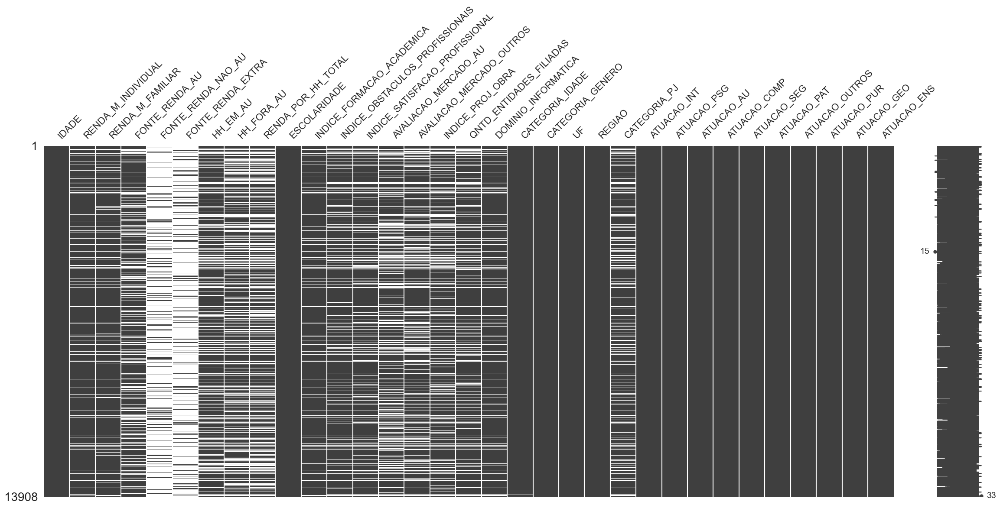

In [396]:
msno.matrix(df_selecao)

In [20]:
df_selecao.isna().sum()

IDADE                                  0
RENDA_M_INDIVIDUAL                  1475
RENDA_M_FAMILIAR                    1791
FONTE_RENDA_AU                      3748
FONTE_RENDA_NAO_AU                 11598
FONTE_RENDA_EXTRA                  11594
HH_EM_AU                            3369
HH_FORA_AU                          4410
RENDA_POR_HH_TOTAL                  5037
ESCOLARIDADE                           0
INDICE_FORMACAO_ACADEMICA           1369
INDICE_OBSTACULOS_PROFISSIONAIS     2147
INDICE_SATISFACAO_PROFISSIONAL      2454
AVALIACAO_MERCADO_AU                4030
AVALIACAO_MERCADO_OUTROS            3445
INDICE_PROJ_OBRA                    3485
QNTD_ENTIDADES_FILIADAS             2504
DOMINIO_INFORMATICA                 1626
CATEGORIA_IDADE                       39
CATEGORIA_GENERO                       0
UF                                     0
REGIAO                                 0
CATEGORIA_PJ                        2526
ATUACAO_INT                            0
ATUACAO_PSG     

In [21]:
df_selecao[df_selecao.CATEGORIA_GENERO.isna()].CATEGORIA_GENERO.index.array

<PandasArray>
[]
Length: 0, dtype: object

In [22]:
thresh_val = 20

<AxesSubplot:>

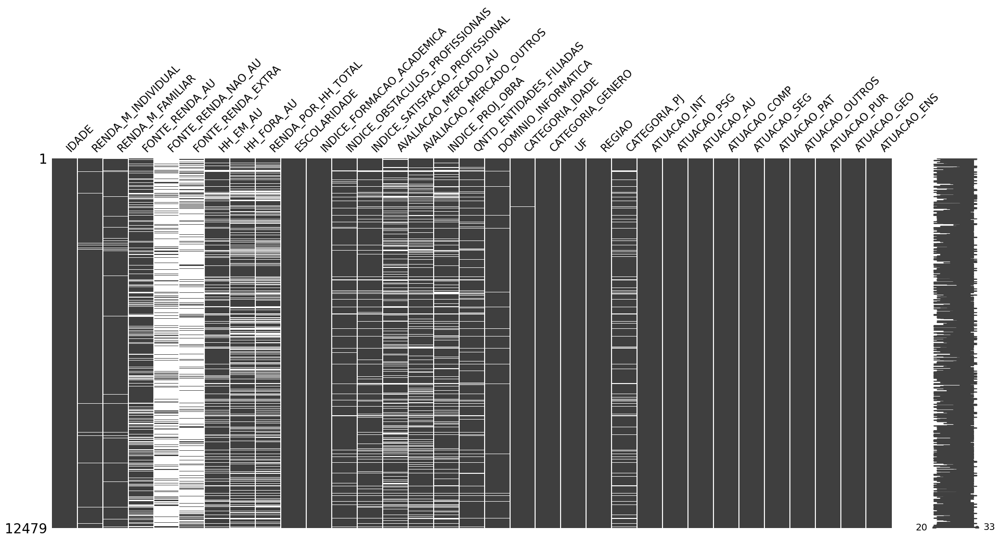

In [23]:
msno.matrix(df_selecao.dropna(thresh=thresh_val,axis=0))

The sparkline at right summarizes the general shape of the data completeness and points out the rows with the maximum and minimum nullity in the dataset.

<AxesSubplot:>

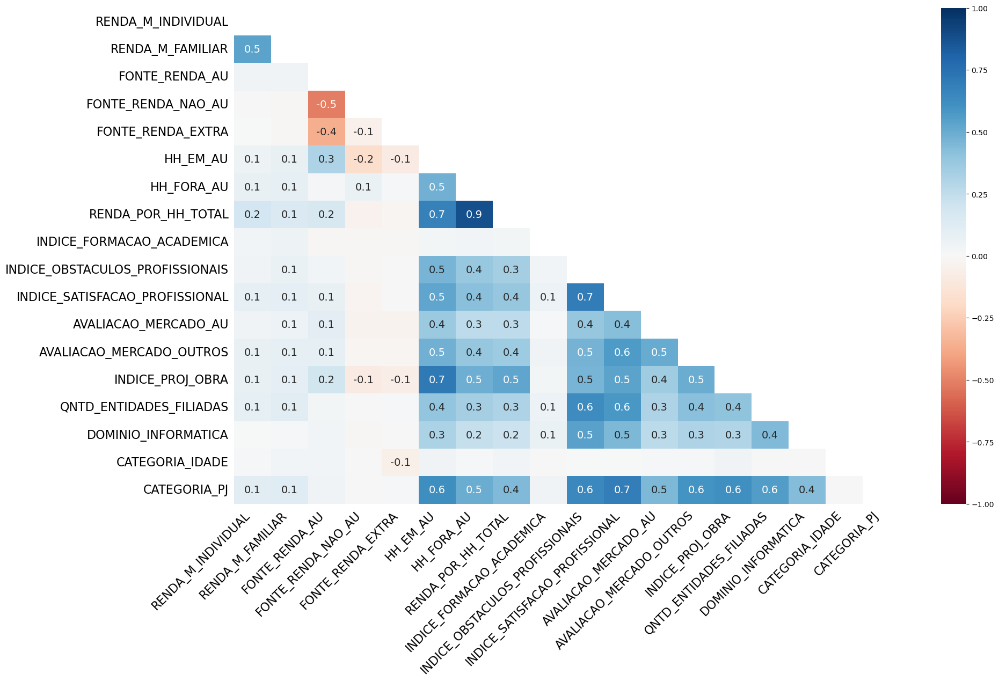

In [24]:
msno.heatmap(df_selecao.dropna(thresh=thresh_val,axis=0))

Nullity correlation ranges from -1 (if one variable appears the other definitely does not) to 0 (variables appearing or not appearing have no effect on one another) to 1 (if one variable appears the other definitely also does).

Variables that are always full or always empty have no meaningful correlation, and so are silently removed from the visualization—in this case for instance the datetime and injury number columns, which are completely filled, are not included.

Entries marked <1 or >-1 have a correlation that is close to being exactingly negative or positive, but is still not quite perfectly so. This points to a small number of records in the dataset which are erroneous. For example, in this dataset the correlation between VEHICLE CODE TYPE 3 and CONTRIBUTING FACTOR VEHICLE 3 is <1, indicating that, contrary to our expectation, there are a few records which have one or the other, but not both. These cases will require special attention.msno.dendrogram(df3)

<AxesSubplot:>

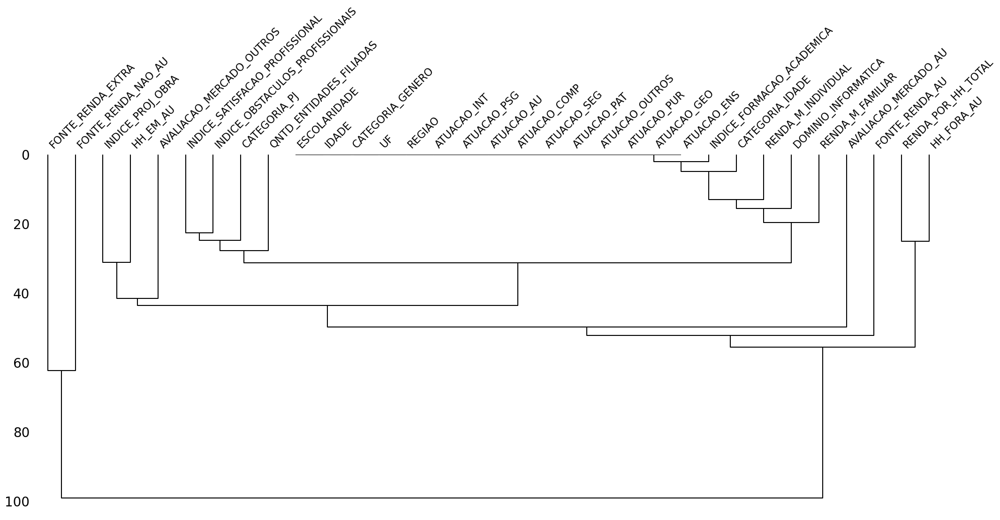

In [25]:
msno.dendrogram(df_selecao.dropna(thresh=thresh_val,axis=0))

To interpret this graph, read it from a top-down perspective. Cluster leaves which linked together at a distance of zero fully predict one another's presence—one variable might always be empty when another is filled, or they might always both be filled or both empty, and so on. In this specific example the dendrogram glues together the variables which are required and therefore present in every record.

## 1.2 Tratamento dos Dados

### Dropagem Inicial de Nulos: Entradas com mais de 20% de valores nulos
### Substituição Parcial dos Nulos: Aplicação de Medianas e Zeros
### Remoção Parcial de Outliers
### Imputation: ?
### Dropagem de Nulos Restantes

In [26]:
import seaborn as sns
import matplotlib.pyplot as plt
from string import ascii_letters
from pandas.plotting import scatter_matrix
from scipy import stats
#from matplotlib import pyplot

### 1.2.1 Substituição Parcial dos Nulos

#### Procedimento:
- Preencher nulos com valores esperados, quando cabível;
- Remover entradas com outliers, para um subconjunto de features;

In [27]:
df_selecao.describe()

,IDADE,RENDA_M_INDIVIDUAL,RENDA_M_FAMILIAR,FONTE_RENDA_AU,FONTE_RENDA_NAO_AU,FONTE_RENDA_EXTRA,HH_EM_AU,HH_FORA_AU,RENDA_POR_HH_TOTAL,ESCOLARIDADE,...,ATUACAO_INT,ATUACAO_PSG,ATUACAO_AU,ATUACAO_COMP,ATUACAO_SEG,ATUACAO_PAT,ATUACAO_OUTROS,ATUACAO_PUR,ATUACAO_GEO,ATUACAO_ENS
count,13908.000000,12433.000000,12117.000000,10160.000000,2310.000000,2314.000000,10539.000000,9498.000000,8871.000000,13908.000000,...,13908.000000,13908.000000,13908.000000,13908.000000,13908.000000,13908.000000,13908.000000,13908.000000,13908.000000,13908.000000
mean,38.446865,3.803346,4.972435,1.099311,1.053247,1.084702,3.691052,1.765266,0.859355,1.511648,...,0.487489,0.119500,0.517544,0.127409,0.032715,0.035663,0.239071,0.082542,0.030198,0.073770
std,11.916477,1.527741,1.743563,0.306249,0.239505,0.297996,1.592876,1.655664,0.655319,0.797778,...,0.499861,0.324387,0.499710,0.333442,0.177896,0.185455,0.426532,0.275199,0.171139,0.261406
min,2.000000,1.000000,1.000000,1.000000,1.000000,1.000000,0.500000,0.500000,0.100000,1.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,29.000000,3.000000,4.000000,1.000000,1.000000,1.000000,3.000000,0.500000,0.545455,1.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,35.000000,4.000000,5.000000,1.000000,1.000000,1.000000,4.000000,1.000000,0.727273,1.000000,...,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
75%,45.000000,4.000000,6.000000,1.000000,1.000000,1.000000,5.000000,3.000000,0.909091,2.000000,...,1.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
max,120.000000,8.000000,8.000000,3.000000,3.000000,3.000000,5.000000,5.000000,8.000000,6.000000,...,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


<AxesSubplot:>

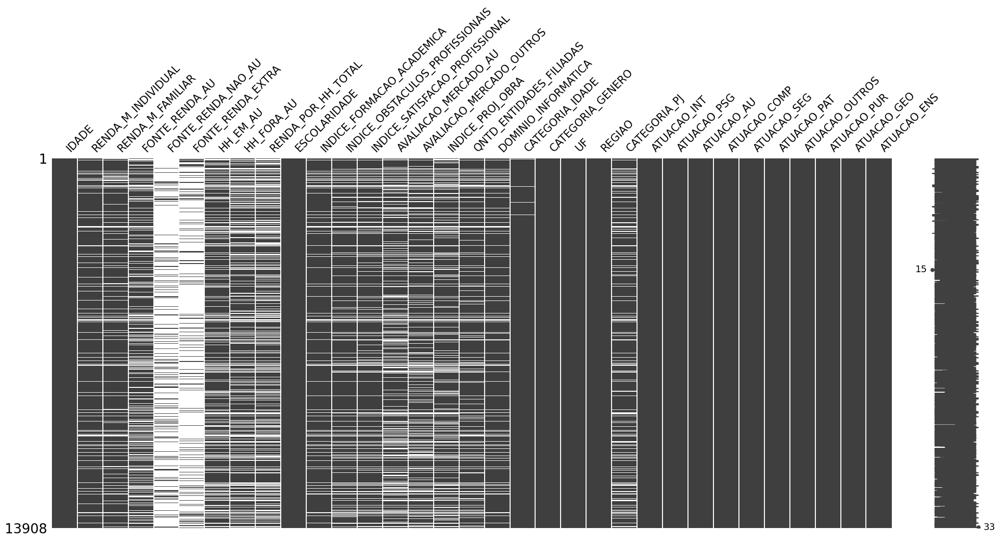

In [28]:
msno.matrix(df_selecao)

In [29]:
df_selecao.isna().sum()

IDADE                                  0
RENDA_M_INDIVIDUAL                  1475
RENDA_M_FAMILIAR                    1791
FONTE_RENDA_AU                      3748
FONTE_RENDA_NAO_AU                 11598
FONTE_RENDA_EXTRA                  11594
HH_EM_AU                            3369
HH_FORA_AU                          4410
RENDA_POR_HH_TOTAL                  5037
ESCOLARIDADE                           0
INDICE_FORMACAO_ACADEMICA           1369
INDICE_OBSTACULOS_PROFISSIONAIS     2147
INDICE_SATISFACAO_PROFISSIONAL      2454
AVALIACAO_MERCADO_AU                4030
AVALIACAO_MERCADO_OUTROS            3445
INDICE_PROJ_OBRA                    3485
QNTD_ENTIDADES_FILIADAS             2504
DOMINIO_INFORMATICA                 1626
CATEGORIA_IDADE                       39
CATEGORIA_GENERO                       0
UF                                     0
REGIAO                                 0
CATEGORIA_PJ                        2526
ATUACAO_INT                            0
ATUACAO_PSG     

In [32]:
dict_fillna = {
    'IDADE': np.nan, 'RENDA_M_INDIVIDUAL':0, 'RENDA_M_FAMILIAR':0, 'FONTE_RENDA_AU':0, 'FONTE_RENDA_NAO_AU':0, 'FONTE_RENDA_EXTRA':0,
    'HH_EM_AU': np.nan,'HH_FORA_AU': np.nan,'RENDA_POR_HH_TOTAL': np.nan, 'ESCOLARIDADE': 0,
    'INDICE_FORMACAO_ACADEMICA': 0, 'INDICE_OBSTACULOS_PROFISSIONAIS': np.nan, 'INDICE_SATISFACAO_PROFISSIONAL': np.nan, 
    'AVALIACAO_MERCADO_AU': np.nan, 'AVALIACAO_MERCADO_OUTROS': np.nan, 'INDICE_PROJ_OBRA': np.nan,
    'QNTD_ENTIDADES_FILIADAS': 0,'DOMINIO_INFORMATICA': 0,'CATEGORIA_GENERO': 'INDEF',
    'UF': np.nan, 'REGIAO': np.nan, 'CATEGORIA_PJ': np.nan,
    'ATUACAO_INT': 0, 'ATUACAO_PSG': 0, 'ATUACAO_AU': 0, 'ATUACAO_COMP': 0, 'ATUACAO_SEG': 0, 'ATUACAO_PAT': 0, 'ATUACAO_OUTROS': 0, 'ATUACAO_PUR': 0,
    'ATUACAO_GEO': 0, 'ATUACAO_ENS': 0,#'CATEGORIA_IDADE': 0
              }

In [33]:
df_selecao.fillna(value=dict_fillna,inplace=True)

<AxesSubplot:>

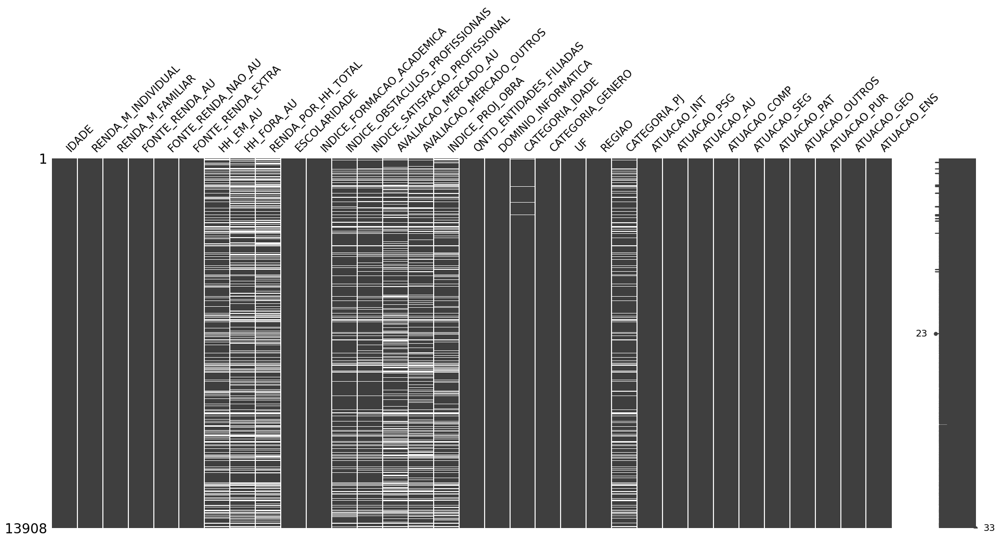

In [34]:
msno.matrix(df_selecao)

### 1.2.2 Remoção Parcial de Outliers

In [35]:
df_selecao.select_dtypes(include = ['float']).info()

<class 'pandas.core.frame.DataFrame'>
Index: 13908 entries, 31 to 45379
Data columns (total 28 columns):
 #   Column                           Non-Null Count  Dtype  
---  ------                           --------------  -----  
 0   IDADE                            13908 non-null  float64
 1   RENDA_M_INDIVIDUAL               13908 non-null  float64
 2   RENDA_M_FAMILIAR                 13908 non-null  float64
 3   FONTE_RENDA_AU                   13908 non-null  float64
 4   FONTE_RENDA_NAO_AU               13908 non-null  float64
 5   FONTE_RENDA_EXTRA                13908 non-null  float64
 6   HH_EM_AU                         10539 non-null  float64
 7   HH_FORA_AU                       9498 non-null   float64
 8   RENDA_POR_HH_TOTAL               8871 non-null   float64
 9   ESCOLARIDADE                     13908 non-null  float64
 10  INDICE_FORMACAO_ACADEMICA        13908 non-null  float64
 11  INDICE_OBSTACULOS_PROFISSIONAIS  11761 non-null  float64
 12  INDICE_SATISFACAO_PROF

#### Subset e Normalização

<AxesSubplot:>

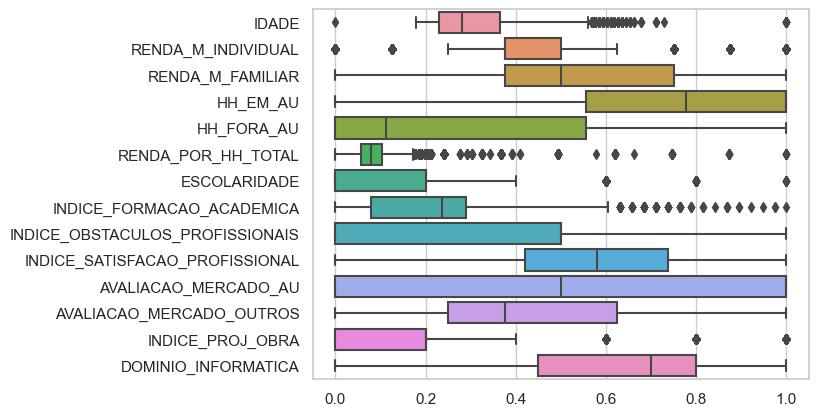

In [36]:
sns.set_theme(style="whitegrid")
#normalized_df=(df-df.mean())/df.std()
df_outliers = df_selecao.select_dtypes(include = ['float'])
df_outliers['CATEGORIA_IDADE'] = df_selecao['CATEGORIA_IDADE']
df_outliers.drop(
    labels=['ATUACAO_INT','ATUACAO_PSG','ATUACAO_AU','ATUACAO_COMP','ATUACAO_SEG','ATUACAO_PAT','ATUACAO_OUTROS','ATUACAO_PUR','ATUACAO_GEO','ATUACAO_ENS','CATEGORIA_IDADE','QNTD_ENTIDADES_FILIADAS','FONTE_RENDA_NAO_AU','FONTE_RENDA_AU','FONTE_RENDA_EXTRA'],
    axis=1,
    inplace=True
)
df_outliers = (df_outliers - df_outliers.min()) / (df_outliers.max() - df_outliers.min())
sns.boxplot(
    data=df_outliers,
    orient='h'
)

#### Nulos do subset

<AxesSubplot:>

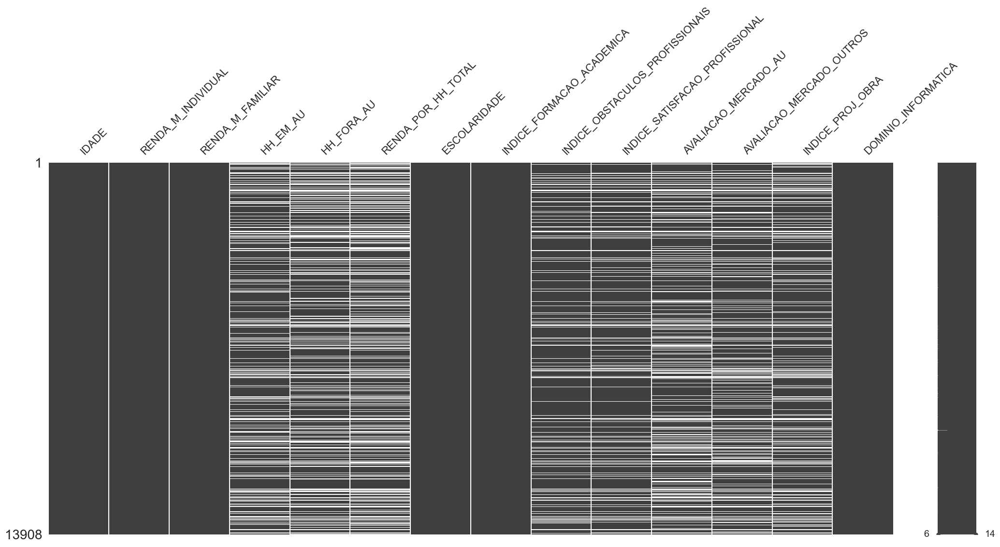

In [37]:
msno.matrix(df_outliers)

#### Marcação e Droppagem dos Outliers

In [39]:
df_outliers.fillna(value=0,inplace=True)
np.abs(stats.zscore(df_outliers) < 3)

,IDADE,RENDA_M_INDIVIDUAL,RENDA_M_FAMILIAR,HH_EM_AU,HH_FORA_AU,RENDA_POR_HH_TOTAL,ESCOLARIDADE,INDICE_FORMACAO_ACADEMICA,INDICE_OBSTACULOS_PROFISSIONAIS,INDICE_SATISFACAO_PROFISSIONAL,AVALIACAO_MERCADO_AU,AVALIACAO_MERCADO_OUTROS,INDICE_PROJ_OBRA,DOMINIO_INFORMATICA
31,True,True,True,True,True,True,True,True,True,True,True,True,True,True
47,True,True,True,True,True,True,True,True,True,True,True,True,True,True
54,True,True,True,True,True,True,True,True,True,True,True,True,True,True
62,True,True,True,True,True,True,False,True,True,True,True,True,True,True
87,True,True,True,True,True,True,True,True,True,True,True,True,True,True
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
45309,True,True,True,True,True,True,True,True,True,True,True,True,True,True
45322,True,True,True,True,True,True,True,True,True,True,True,True,True,True
45364,True,True,True,True,True,True,True,True,True,True,True,True,True,True
45365,True,True,True,True,True,True,False,False,True,True,True,True,True,True


In [40]:
df_selecao = df_selecao[(np.abs(stats.zscore(df_outliers)) < 3).all(axis=1)]

#### Revisão dos Outliers e Nulos

<AxesSubplot:>

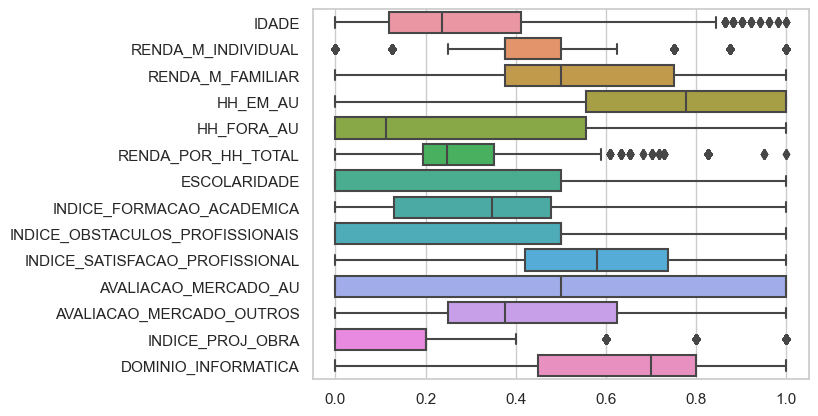

In [42]:
sns.set_theme(style="whitegrid")
#normalized_df=(df-df.mean())/df.std()
df_outliers = df_selecao.select_dtypes(include = ['float'])
df_outliers.drop(
    labels=['ATUACAO_INT','ATUACAO_PSG','ATUACAO_AU','ATUACAO_COMP','ATUACAO_SEG','ATUACAO_PAT','ATUACAO_OUTROS','ATUACAO_PUR','ATUACAO_GEO','ATUACAO_ENS','QNTD_ENTIDADES_FILIADAS','FONTE_RENDA_NAO_AU','FONTE_RENDA_AU','FONTE_RENDA_EXTRA'],
    axis=1,
    inplace=True
)
df_outliers = (df_outliers - df_outliers.min()) / (df_outliers.max() - df_outliers.min())
sns.boxplot(
    data=df_outliers,
    orient='h'
)

In [43]:
dict_fillna = {
    'IDADE': np.nan, 'RENDA_M_INDIVIDUAL':0, 'RENDA_M_FAMILIAR':0, 'FONTE_RENDA_AU':0, 'FONTE_RENDA_NAO_AU':0, 'FONTE_RENDA_EXTRA':0,
    'HH_EM_AU': 0,'HH_FORA_AU': 0,'RENDA_POR_HH_TOTAL': np.nan, 'ESCOLARIDADE': 0,
    'INDICE_FORMACAO_ACADEMICA': 0, 'INDICE_OBSTACULOS_PROFISSIONAIS': np.nan, 'INDICE_SATISFACAO_PROFISSIONAL': np.nan, 
    'AVALIACAO_MERCADO_AU': np.nan, 'AVALIACAO_MERCADO_OUTROS': np.nan, 'INDICE_PROJ_OBRA': np.nan,
    'QNTD_ENTIDADES_FILIADAS': 0,'DOMINIO_INFORMATICA': 0,'CATEGORIA_GENERO': 'INDEF',
    'UF': np.nan, 'REGIAO': np.nan, 'CATEGORIA_PJ': np.nan,
    'ATUACAO_INT': 0, 'ATUACAO_PSG': 0, 'ATUACAO_AU': 0, 'ATUACAO_COMP': 0, 'ATUACAO_SEG': 0, 'ATUACAO_PAT': 0, 'ATUACAO_OUTROS': 0, 'ATUACAO_PUR': 0,
    'ATUACAO_GEO': 0, 'ATUACAO_ENS': 0,#'CATEGORIA_IDADE': 0,
              }

In [45]:
df_selecao.fillna(value=dict_fillna,inplace=True)

C:\Users\Bruno\AppData\Local\Temp\ipykernel_9652\627581503.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_selecao.fillna(value=dict_fillna,inplace=True)


<AxesSubplot:>

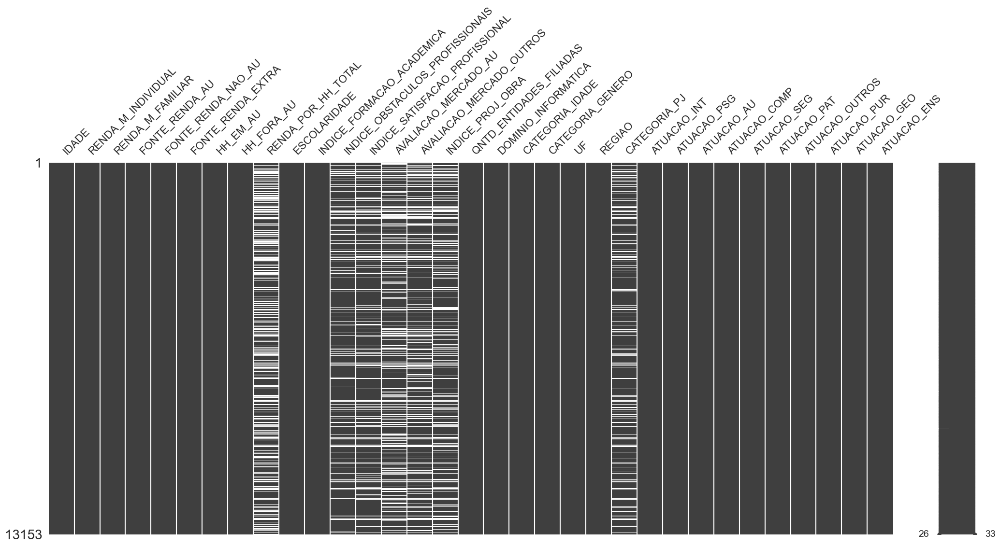

In [46]:
msno.matrix(df_selecao)

In [47]:
df_selecao.describe().transpose()

,count,mean,std,min,25%,50%,75%,max
IDADE,13153.0,37.938797,11.318243,23.0,29.000000,35.000000,44.000000,74.0
RENDA_M_INDIVIDUAL,13153.0,3.344864,1.841947,0.0,3.000000,3.000000,4.000000,8.0
RENDA_M_FAMILIAR,13153.0,4.281229,2.324705,0.0,3.000000,4.000000,6.000000,8.0
FONTE_RENDA_AU,13153.0,0.807572,0.549550,0.0,0.000000,1.000000,1.000000,3.0
FONTE_RENDA_NAO_AU,13153.0,0.173192,0.402005,0.0,0.000000,0.000000,0.000000,3.0
FONTE_RENDA_EXTRA,13153.0,0.166274,0.402184,0.0,0.000000,0.000000,0.000000,3.0
HH_EM_AU,13153.0,2.833992,2.102713,0.0,0.000000,4.000000,5.000000,5.0
HH_FORA_AU,13153.0,1.202197,1.600722,0.0,0.000000,0.500000,2.000000,5.0
RENDA_POR_HH_TOTAL,8250.0,0.758627,0.347466,0.1,0.545455,0.666667,0.909091,2.4
ESCOLARIDADE,13153.0,1.426975,0.652300,1.0,1.000000,1.000000,2.000000,3.0


### Histogramas das Variáveis Básicas

<AxesSubplot:xlabel='IDADE', ylabel='Probability'>

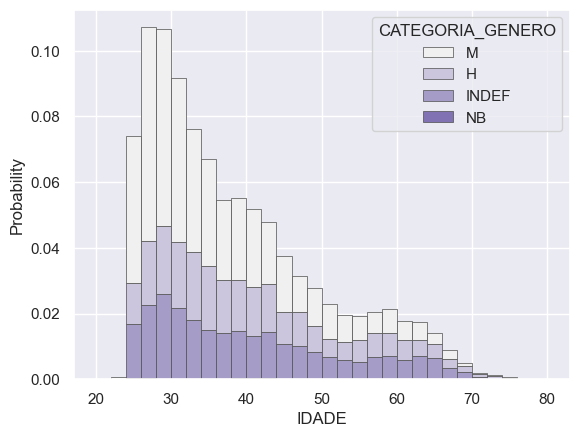

In [48]:
sns.set_theme(style="darkgrid")
sns.histplot(
    data=df_selecao,
    x="IDADE", hue="CATEGORIA_GENERO",
    #x="IDADE", hue="CATEGORIA_PJ",
    #x="IDADE", hue="REGIAO",
    multiple="stack",
    palette="light:m",
    edgecolor=".3",
    linewidth=.5,
    log_scale=False,
    stat='probability',
    bins=20,
    binrange=(20,80), alpha=1, binwidth=2
)

In [ ]:
sns.set_theme(style="darkgrid")
sns.histplot(
    data=df_selecao,
    #x="RENDA_POR_HH_TOTAL", hue="CATEGORIA_GENERO",
    x="RENDA_POR_HH_TOTAL", hue="CATEGORIA_PJ",
    #x="RENDA_POR_HH_TOTAL", hue="REGIAO",
    multiple="stack",
    palette="light:m",
    edgecolor=".3",
    linewidth=.5,
    log_scale=False,
    stat='probability',
    bins=6,
    binrange=(0,6), alpha=1, binwidth=1
)

In [ ]:
from scipy.stats import ks_2samp
from scipy.stats import shapiro
s_stat, s_pval = shapiro(df_selecao['RENDA_POR_HH_TOTAL'])
print(f'\n Teste de normalidade de Shapiro-Wilkstat: {s_stat}','\n',f'p-value: {s_pval}')

s1 = df_selecao[['RENDA_POR_HH_TOTAL','CATEGORIA_GENERO']].query('CATEGORIA_GENERO == "M"')['RENDA_POR_HH_TOTAL']
s2 = df_selecao[['RENDA_POR_HH_TOTAL','CATEGORIA_GENERO']].query('CATEGORIA_GENERO == "H"')['RENDA_POR_HH_TOTAL']
ks_stat, ks_pval = ks_2samp(s1,s2)
print(f'\n Teste de semelhança de Kolmogorov-Smirnoff: {ks_stat}','\n',f'p-value: {ks_pval}')

In [ ]:
sns.set_theme(style="darkgrid")
sns.histplot(
    data=df_selecao,
    x="HH_EM_AU", hue="CATEGORIA_GENERO",
    #x="HH_EM_AU", hue="CATEGORIA_PJ",
    #x="HH_EM_AU", hue="REGIAO",
    multiple="stack",
    palette="light:m",
    edgecolor=".3",
    linewidth=.5,
    log_scale=False,
    stat='probability',
    bins=10,
    binrange=(0,6), alpha=1, binwidth=1
)

In [ ]:
sns.set_theme(style="darkgrid")
sns.histplot(
    data=df_selecao,
    #x="RENDA_M_INDIVIDUAL", hue="CATEGORIA_GENERO",
    x="RENDA_M_INDIVIDUAL", hue="CATEGORIA_PJ",
    #x="RENDA_M_INDIVIDUAL", hue="REGIAO",
    multiple="stack",
    palette="light:m",
    edgecolor=".3",
    linewidth=.5,
    log_scale=False,
    stat='probability',
    bins=10,
    binrange=(0,6), alpha=1, binwidth=1
)

In [ ]:
from scipy.stats import ks_2samp
from scipy.stats import shapiro
#s_stat, s_pval = shapiro(df_selecao['RENDA_M_INDIVIDUAL'])
#print(f'\n Teste de normalidade de Shapiro-Wilkstat: {s_stat}','\n',f'p-value: {s_pval}')

s1 = df_selecao[['RENDA_M_INDIVIDUAL','CATEGORIA_PJ']].query('CATEGORIA_PJ == "NAO"')['RENDA_M_INDIVIDUAL']
s2 = df_selecao[['RENDA_M_INDIVIDUAL','CATEGORIA_PJ']].query('CATEGORIA_PJ == "UNI"')['RENDA_M_INDIVIDUAL']
ks_stat, ks_pval = ks_2samp(s1,s2)
print(f'\n Teste de semelhança de Kolmogorov-Smirnoff: {ks_stat}','\n',f'p-value: {ks_pval}')

In [ ]:
sns.set_theme(style="darkgrid")
sns.histplot(
    data=df_selecao,
    x="INDICE_SATISFACAO_PROFISSIONAL", color="skyblue",
    #x="INDICE_SATISFACAO_PROFISSIONAL", hue="CATEGORIA_GENERO",
    #x="INDICE_SATISFACAO_PROFISSIONAL", hue="CATEGORIA_PJ",
    #x="INDICE_SATISFACAO_PROFISSIONAL", hue="REGIAO",
    multiple="stack",
    palette="light:m",
    edgecolor=".3",
    linewidth=.5,
    log_scale=False,
    stat='probability',
    bins=10,
    binrange=(0,6), alpha=1, binwidth=1
)

In [ ]:
sns.set_theme(style="darkgrid")
sns.histplot(
    data=df_selecao,
    #x="INDICE_FORMACAO_ACADEMICA", color="skyblue",
    x="INDICE_FORMACAO_ACADEMICA", hue="CATEGORIA_GENERO",
    #x="INDICE_FORMACAO_ACADEMICA", hue="CATEGORIA_PJ",
    #x="INDICE_FORMACAO_ACADEMICA", hue="REGIAO",
    multiple="stack",
    palette="light:m",
    edgecolor=".3",
    linewidth=.5,
    log_scale=False,
    stat='probability',
    bins=10,
    binrange=(0,30), alpha=1, binwidth=1
)

In [ ]:
sns.violinplot(
    data=df_selecao[['INDICE_FORMACAO_ACADEMICA','CATEGORIA_IDADE','CATEGORIA_GENERO']].query('CATEGORIA_GENERO == "H" or CATEGORIA_GENERO == "M"'),
    y="INDICE_FORMACAO_ACADEMICA", x="CATEGORIA_IDADE", hue='CATEGORIA_GENERO', split=True
)

In [ ]:
sns.violinplot(
    #data=df_selecao[['RENDA_M_INDIVIDUAL','CATEGORIA_IDADE','CATEGORIA_GENERO']].query('CATEGORIA_GENERO' == "H" or 'CATEGORIA_GENERO == "M"')['RENDA_M_INDIVIDUAL'],
    data=df_selecao[['RENDA_M_INDIVIDUAL','CATEGORIA_IDADE','CATEGORIA_GENERO']].query('CATEGORIA_GENERO == "H" or CATEGORIA_GENERO == "M"'),
    y="RENDA_M_INDIVIDUAL", x="CATEGORIA_IDADE", hue="CATEGORIA_GENERO", split=True
)

## Correlação de Pearson e Gráficos de Dispersão

In [ ]:
df_sns = df_selecao.drop(labels=['IDADE','ATUACAO_ENS','ATUACAO_PUR','ATUACAO_OUTROS','ATUACAO_GEO','ATUACAO_GEO','ATUACAO_GEO','ATUACAO_COMP','ATUACAO_SEG','ATUACAO_PAT','ATUACAO_GEO','ATUACAO_PSG','ATUACAO_INT','ATUACAO_AU','REGIAO','UF','CATEGORIA_IDADE'],axis=1)
#df_sns = df_selecao

In [ ]:
sns.set_theme(style="darkgrid")
corr = df_sns.corr(method='pearson')
#corr = df_sns.corr(method='pearson')
mask = np.triu(np.ones_like(corr, dtype=bool))
f, ax = plt.subplots(figsize=(16, 16))

cmap = sns.color_palette("vlag_r", as_cmap=True)
#cmap = sns.color_palette("viridis", as_cmap=True)

sns.heatmap(corr, mask=mask, cmap=cmap, vmax=.4, vmin=-.4, center=0,
            annot=True, square=True, linewidths=.9, cbar_kws={"shrink": .5})

In [ ]:
df_sns = df_selecao[['RENDA_M_INDIVIDUAL','HH_EM_AU','INDICE_SATISFACAO_PROFISSIONAL','INDICE_FORMACAO_ACADEMICA','DOMINIO_INFORMATICA','ATUACAO_INT','ATUACAO_AU','ATUACAO_PUR','ATUACAO_PSG','ATUACAO_COMP','ATUACAO_SEG','ATUACAO_PAT','ATUACAO_GEO','ATUACAO_ENS','ATUACAO_OUTROS']]
sns.set_theme(style="darkgrid")
corr = df_sns.corr(method='spearman')
#corr = df_sns.corr(method='pearson')
mask = np.triu(np.ones_like(corr, dtype=bool))
f, ax = plt.subplots(figsize=(16, 16))

cmap = sns.color_palette("vlag_r", as_cmap=True)
#cmap = sns.color_palette("viridis", as_cmap=True)

sns.heatmap(corr, mask=mask, cmap=cmap, vmax=.6, vmin=-.6, center=0,
            annot=True, square=True, linewidths=.9, cbar_kws={"shrink": .5})

## Pairplot, por Região ou Estado

In [ ]:
df_sns = df_selecao[['RENDA_M_INDIVIDUAL','FONTE_RENDA_AU','HH_EM_AU','INDICE_FORMACAO_ACADEMICA','IDADE','DOMINIO_INFORMATICA','REGIAO']]
sns.pairplot(df_sns, hue="REGIAO", kind='scatter')
#{‘scatter’, ‘kde’, ‘hist’, ‘reg’}
#sns.pairplot(df_sns, hue="UF")

In [ ]:
df_sns = df_selecao[['RENDA_M_INDIVIDUAL','FONTE_RENDA_AU','HH_EM_AU','INDICE_FORMACAO_ACADEMICA','IDADE','DOMINIO_INFORMATICA','REGIAO']]
sns.pairplot(df_sns, hue="IDADE", kind='scatter', diag_kind='kde')
#{‘scatter’, ‘kde’, ‘hist’, ‘reg’}
#diag_kind{‘auto’, ‘hist’, ‘kde’, None}

In [ ]:
df_sns = df_selecao[['RENDA_M_INDIVIDUAL','FONTE_RENDA_AU','HH_EM_AU','INDICE_FORMACAO_ACADEMICA','IDADE','DOMINIO_INFORMATICA','REGIAO','CATEGORIA_PJ']]
sns.pairplot(df_sns, hue="CATEGORIA_PJ")

## Renda Média Individual, Renda por HH, Índice de Satisfação Profissional por Região, PJ e Idade.

### Explorando a Renda Média Individual

In [ ]:
sns.set_theme(style="whitegrid")
sns.boxplot(x=df_selecao["REGIAO"], y=df_selecao["RENDA_M_INDIVIDUAL"], palette='flare')

In [ ]:
sns.set_theme(style="whitegrid")
sns.boxplot(x=df_selecao["CATEGORIA_PJ"], y=df_selecao["RENDA_M_INDIVIDUAL"], palette='flare')

In [ ]:
sns.histplot(data=df_selecao, x="RENDA_M_INDIVIDUAL", hue="CATEGORIA_PJ", stat='probability', bins=8, common_bins=True, binrange=(1,8), common_norm=True, multiple='fill',)

In [ ]:
sns.set_theme(style="whitegrid")
sns.boxplot(x=df_selecao["CATEGORIA_IDADE"], y=df_selecao["RENDA_M_INDIVIDUAL"], palette='flare')

In [ ]:
sns.set_theme(style="darkgrid")
sns.histplot(data=df_selecao, x="IDADE", y="RENDA_M_INDIVIDUAL", color="skyblue", stat='density', bins=20, alpha=1, binwidth=1, discrete=False, common_norm=False, multiple='stack')

In [ ]:
sns.histplot(data=df_selecao, y="RENDA_M_INDIVIDUAL", hue="CATEGORIA_IDADE", stat='probability', palette='mako_r', common_bins=True, binrange=(1,9), binwidth=1, multiple='fill',legend=True)

In [ ]:
from sklearn.linear_model import LinearRegression
# Creating a Linear Regression model on our data
dado_1 = df_selecao['RENDA_M_INDIVIDUAL'].array.reshape(-1, 1)
dado_2 = df_selecao['INDICE_FORMACAO_ACADEMICA'].array.reshape(-1, 1)
reg = LinearRegression().fit(dado_1, dado_2)
reg.score(dado_1, dado_2)
# Creating a plot
#ax = df_selecao.plot.scatter(x='RENDA_M_INDIVIDUAL', y='INDICE_FORMACAO_ACADEMICA', alpha=.1)
#ax.plot(df_selecao['RENDA_M_INDIVIDUAL'], lin.predict(df_selecao[['INDICE_FORMACAO_ACADEMICA']]), c='r')

### Explorando a Renda por HH Total

In [ ]:
sns.set_theme(style="whitegrid")
sns.boxplot(x=df_selecao["REGIAO"], y=df_selecao["RENDA_POR_HH_TOTAL"], palette='flare')

In [ ]:
sns.set_theme(style="whitegrid")
sns.boxplot(x=df_selecao["CATEGORIA_PJ"], y=df_selecao["RENDA_POR_HH_TOTAL"], palette='flare')

In [ ]:
sns.set_theme(style="whitegrid")
sns.histplot(data=df_selecao, x="RENDA_POR_HH_TOTAL", hue="CATEGORIA_PJ", stat='probability', bins=10, common_bins=True, binrange=(0,6), common_norm=True, multiple='fill',)

In [ ]:
sns.set_theme(style="whitegrid")
sns.boxplot(x=df_selecao["CATEGORIA_IDADE"], y=df_selecao["RENDA_POR_HH_TOTAL"], palette='flare')

In [ ]:
sns.set_theme(style="darkgrid")
sns.histplot(data=df_selecao, x="IDADE", y="RENDA_POR_HH_TOTAL", color="skyblue", stat='density', bins=20, alpha=1, binwidth=1, discrete=False, common_norm=False, multiple='stack')

In [ ]:
sns.histplot(data=df_selecao, y="RENDA_POR_HH_TOTAL", hue="CATEGORIA_IDADE", stat='probability', palette='mako_r', common_bins=True, binrange=(0,8), binwidth=1, multiple='fill',legend=True)

In [ ]:
from sklearn.linear_model import LinearRegression
# Creating a Linear Regression model on our data
dado_1 = data['INDICE_FORMACAO_ACADEMICA'].array.reshape(-1, 1)
dado_2 = data['RENDA_POR_HH_TOTAL'].array.reshape(-1, 1)
reg = LinearRegression().fit(dado_1, dado_2)
reg.score(dado_1, dado_2)

### Explorando a Satisfação Profissional

In [ ]:
sns.set_theme(style="whitegrid")
sns.boxplot(x=df_selecao["REGIAO"], y=df_selecao["INDICE_SATISFACAO_PROFISSIONAL"], palette='flare')

In [ ]:
sns.set_theme(style="whitegrid")
sns.boxplot(x=df_selecao["CATEGORIA_PJ"], y=df_selecao["INDICE_SATISFACAO_PROFISSIONAL"], palette='flare')

In [ ]:
sns.set_theme(style="whitegrid")
sns.histplot(data=df_selecao, x="INDICE_SATISFACAO_PROFISSIONAL", hue="CATEGORIA_PJ", stat='probability', bins=20, common_bins=True, binrange=(1,20), common_norm=True, multiple='fill',)

In [ ]:
sns.set_theme(style="whitegrid")
sns.boxplot(x=df_selecao["CATEGORIA_IDADE"], y=df_selecao["INDICE_SATISFACAO_PROFISSIONAL"], palette='flare')

In [ ]:
sns.histplot(data=df_selecao, x="IDADE", y="INDICE_SATISFACAO_PROFISSIONAL", color="skyblue", stat='density', bins=20, alpha=1, binwidth=1, discrete=False, common_norm=False, multiple='stack')

In [ ]:
sns.histplot(data=df_selecao, y="INDICE_SATISFACAO_PROFISSIONAL", hue="CATEGORIA_IDADE", palette='mako_r', stat='probability', common_bins=True, binrange=(0,20), binwidth=1, multiple='fill',legend=True)

## Outros

In [ ]:
sns.histplot(data=df_selecao, x="RENDA_POR_HH_TOTAL", hue="CATEGORIA_IDADE", stat='probability', bins=20, common_bins=True, binrange=(0,6), common_norm=True, multiple='stack', kde=True)

In [ ]:
sns.histplot(data=df_selecao, x="RENDA_M_INDIVIDUAL", hue="CATEGORIA_IDADE", stat='probability', common_bins=True, binrange=(0,10), binwidth=1, multiple='stack')

In [ ]:
df_sns = df_selecao[['HH_EM_AU','HH_FORA_AU','RENDA_POR_HH_TOTAL','RENDA_M_INDIVIDUAL','FONTE_RENDA_AU']]
sns.pairplot(df_sns, hue='RENDA_M_INDIVIDUAL', kind='scatter', diag_kind='auto')
#{‘scatter’, ‘kde’, ‘hist’, ‘reg’}
#diag_kind{‘auto’, ‘hist’, ‘kde’, None}

## Classificação Não-Supervisionada

In [ ]:
from scipy.cluster.hierarchy import linkage, dendrogram
import matplotlib.pyplot as plt
# Calculate the linkage: mergings
mergings = linkage(samples,method='complete')
# Plot the dendrogram, using varieties as labels
dendrogram(mergings,
           labels=varieties,
           leaf_rotation=90,
           leaf_font_size=6,
)
plt.show()

## Pré-Processamento

In [379]:
df_selecao.describe().transpose()

,count,mean,std,min,25%,50%,75%,max
IDADE,13153.0,37.938797,11.318243,23.0,29.000000,35.000000,44.000000,74.0
RENDA_M_INDIVIDUAL,13153.0,3.344864,1.841947,0.0,3.000000,3.000000,4.000000,8.0
RENDA_M_FAMILIAR,13153.0,4.281229,2.324705,0.0,3.000000,4.000000,6.000000,8.0
FONTE_RENDA_AU,13153.0,0.807572,0.549550,0.0,0.000000,1.000000,1.000000,3.0
FONTE_RENDA_NAO_AU,13153.0,0.173192,0.402005,0.0,0.000000,0.000000,0.000000,3.0
FONTE_RENDA_EXTRA,13153.0,0.166274,0.402184,0.0,0.000000,0.000000,0.000000,3.0
HH_EM_AU,13153.0,2.833992,2.102713,0.0,0.000000,4.000000,5.000000,5.0
HH_FORA_AU,13153.0,1.202197,1.600722,0.0,0.000000,0.500000,2.000000,5.0
RENDA_POR_HH_TOTAL,8250.0,0.758627,0.347466,0.1,0.545455,0.666667,0.909091,2.4
ESCOLARIDADE,13153.0,1.426975,0.652300,1.0,1.000000,1.000000,2.000000,3.0


## Hot Encoding

In [383]:
conjunto_features_1 = df_selecao.drop(
    #['CATEGORIA_IDADE','UF','REGIAO'],
    ['CATEGORIA_IDADE','UF'],
    axis=1)

features = conjunto_features_1

In [382]:
features.info()

<class 'pandas.core.frame.DataFrame'>
Index: 13153 entries, 31 to 45379
Data columns (total 31 columns):
 #   Column                           Non-Null Count  Dtype  
---  ------                           --------------  -----  
 0   IDADE                            13153 non-null  float64
 1   RENDA_M_INDIVIDUAL               13153 non-null  float64
 2   RENDA_M_FAMILIAR                 13153 non-null  float64
 3   FONTE_RENDA_AU                   13153 non-null  float64
 4   FONTE_RENDA_NAO_AU               13153 non-null  float64
 5   FONTE_RENDA_EXTRA                13153 non-null  float64
 6   HH_EM_AU                         13153 non-null  float64
 7   HH_FORA_AU                       13153 non-null  float64
 8   RENDA_POR_HH_TOTAL               8250 non-null   float64
 9   ESCOLARIDADE                     13153 non-null  float64
 10  INDICE_FORMACAO_ACADEMICA        13153 non-null  float64
 11  INDICE_OBSTACULOS_PROFISSIONAIS  11035 non-null  float64
 12  INDICE_SATISFACAO_PROF

In [356]:
features.mean()

IDADE                              37.555607
RENDA_M_INDIVIDUAL                  3.807568
RENDA_M_FAMILIAR                    4.914936
FONTE_RENDA_AU                      0.958929
FONTE_RENDA_NAO_AU                  0.177357
FONTE_RENDA_EXTRA                   0.166436
HH_EM_AU                            3.791724
HH_FORA_AU                          1.632980
RENDA_POR_HH_TOTAL                  0.759482
ESCOLARIDADE                        1.534841
INDICE_FORMACAO_ACADEMICA           9.190894
INDICE_OBSTACULOS_PROFISSIONAIS     1.725581
INDICE_SATISFACAO_PROFISSIONAL     12.107830
AVALIACAO_MERCADO_AU                1.920474
AVALIACAO_MERCADO_OUTROS            4.275804
INDICE_PROJ_OBRA                    2.256576
QNTD_ENTIDADES_FILIADAS             0.149208
DOMINIO_INFORMATICA                14.124596
CATEGORIA_PJ                        0.998462
ATUACAO_INT                         0.644362
ATUACAO_PSG                         0.160129
ATUACAO_AU                          0.692509
ATUACAO_CO

In [376]:
hot_encoding = pd.DataFrame()
hot_encoding = pd.concat([hot_encoding, pd.get_dummies(df_selecao['RENDA_M_INDIVIDUAL'], prefix='RENDA_M_INDIVIDUAL', drop_first=True)], axis=1)
hot_encoding = pd.concat([hot_encoding, pd.get_dummies(df_selecao['RENDA_M_FAMILIAR'], prefix='RENDA_M_FAMILIAR', drop_first=True)], axis=1)
hot_encoding = pd.concat([hot_encoding, pd.get_dummies(df_selecao['FONTE_RENDA_AU'], prefix='FONTE_RENDA_AU', drop_first=True)], axis=1)
hot_encoding = pd.concat([hot_encoding, pd.get_dummies(df_selecao['FONTE_RENDA_NAO_AU'], prefix='FONTE_RENDA_NAO_AU', drop_first=True)], axis=1)
hot_encoding = pd.concat([hot_encoding, pd.get_dummies(df_selecao['FONTE_RENDA_EXTRA'], prefix='FONTE_RENDA_EXTRA', drop_first=True)], axis=1)
hot_encoding = pd.concat([hot_encoding, pd.get_dummies(df_selecao['HH_EM_AU'], prefix='HH_EM_AU', drop_first=True)], axis=1)
hot_encoding = pd.concat([hot_encoding, pd.get_dummies(df_selecao['HH_FORA_AU'], prefix='HH_FORA_AU', drop_first=True)], axis=1)
hot_encoding = pd.concat([hot_encoding, pd.get_dummies(df_selecao['ESCOLARIDADE'], prefix='ESCOLARIDADE', drop_first=True)], axis=1)
hot_encoding = pd.concat([hot_encoding, pd.get_dummies(df_selecao['INDICE_FORMACAO_ACADEMICA'], prefix='INDICE_FORMACAO_ACADEMICA', drop_first=True)], axis=1)
hot_encoding = pd.concat([hot_encoding, pd.get_dummies(df_selecao['INDICE_OBSTACULOS_PROFISSIONAIS'], prefix='INDICE_OBSTACULOS_PROFISSIONAIS', drop_first=True)], axis=1)
hot_encoding = pd.concat([hot_encoding, pd.get_dummies(df_selecao['INDICE_SATISFACAO_PROFISSIONAL'], prefix='INDICE_SATISFACAO_PROFISSIONAL', drop_first=True)], axis=1)
hot_encoding = pd.concat([hot_encoding, pd.get_dummies(df_selecao['AVALIACAO_MERCADO_AU'], prefix='AVALIACAO_MERCADO_AU', drop_first=True)], axis=1)
hot_encoding = pd.concat([hot_encoding, pd.get_dummies(df_selecao['AVALIACAO_MERCADO_OUTROS'], prefix='AVALIACAO_MERCADO_OUTROS', drop_first=True)], axis=1)
hot_encoding = pd.concat([hot_encoding, pd.get_dummies(df_selecao['INDICE_PROJ_OBRA'], prefix='INDICE_PROJ_OBRA', drop_first=True)], axis=1)
hot_encoding = pd.concat([hot_encoding, pd.get_dummies(df_selecao['QNTD_ENTIDADES_FILIADAS'], prefix='QNTD_ENTIDADES_FILIADAS', drop_first=True)], axis=1)
hot_encoding = pd.concat([hot_encoding, pd.get_dummies(df_selecao['DOMINIO_INFORMATICA'], prefix='DOMINIO_INFORMATICA', drop_first=True)], axis=1)
hot_encoding = pd.concat([hot_encoding, pd.get_dummies(df_selecao['CATEGORIA_PJ'], prefix='CATEGORIA_PJ', drop_first=True)], axis=1)
hot_encoding = pd.concat([hot_encoding, pd.get_dummies(df_selecao['CATEGORIA_IDADE'], prefix='CATEGORIA_IDADE', drop_first=True)], axis=1)
hot_encoding = pd.concat([hot_encoding, pd.get_dummies(df_selecao['ATUACAO_AU'], prefix='ATUACAO_AU', drop_first=True)], axis=1)
hot_encoding = pd.concat([hot_encoding, pd.get_dummies(df_selecao['ATUACAO_INT'], prefix='ATUACAO_INT', drop_first=True)], axis=1)
hot_encoding = pd.concat([hot_encoding, pd.get_dummies(df_selecao['ATUACAO_PSG'], prefix='ATUACAO_PSG', drop_first=True)], axis=1)
hot_encoding = pd.concat([hot_encoding, pd.get_dummies(df_selecao['ATUACAO_PUR'], prefix='ATUACAO_PUR', drop_first=True)], axis=1)
hot_encoding = pd.concat([hot_encoding, pd.get_dummies(df_selecao['ATUACAO_GEO'], prefix='ATUACAO_GEO', drop_first=True)], axis=1)
hot_encoding = pd.concat([hot_encoding, pd.get_dummies(df_selecao['ATUACAO_COMP'], prefix='ATUACAO_COMP', drop_first=True)], axis=1)
hot_encoding = pd.concat([hot_encoding, pd.get_dummies(df_selecao['ATUACAO_SEG'], prefix='ATUACAO_SEG', drop_first=True)], axis=1)
hot_encoding = pd.concat([hot_encoding, pd.get_dummies(df_selecao['ATUACAO_PAT'], prefix='ATUACAO_PAT', drop_first=True)], axis=1)
hot_encoding = pd.concat([hot_encoding, pd.get_dummies(df_selecao['ATUACAO_ENS'], prefix='ATUACAO_ENS', drop_first=True)], axis=1)
hot_encoding = pd.concat([hot_encoding, pd.get_dummies(df_selecao['ATUACAO_OUTROS'], prefix='ATUACAO_OUTROS', drop_first=True)], axis=1)

hot_encoding.columns.tolist()

['RENDA_M_INDIVIDUAL_1.0',
 'RENDA_M_INDIVIDUAL_2.0',
 'RENDA_M_INDIVIDUAL_3.0',
 'RENDA_M_INDIVIDUAL_4.0',
 'RENDA_M_INDIVIDUAL_5.0',
 'RENDA_M_INDIVIDUAL_6.0',
 'RENDA_M_INDIVIDUAL_7.0',
 'RENDA_M_INDIVIDUAL_8.0',
 'RENDA_M_FAMILIAR_1.0',
 'RENDA_M_FAMILIAR_2.0',
 'RENDA_M_FAMILIAR_3.0',
 'RENDA_M_FAMILIAR_4.0',
 'RENDA_M_FAMILIAR_5.0',
 'RENDA_M_FAMILIAR_6.0',
 'RENDA_M_FAMILIAR_7.0',
 'RENDA_M_FAMILIAR_8.0',
 'FONTE_RENDA_AU_1.0',
 'FONTE_RENDA_AU_2.0',
 'FONTE_RENDA_AU_3.0',
 'FONTE_RENDA_NAO_AU_1.0',
 'FONTE_RENDA_NAO_AU_2.0',
 'FONTE_RENDA_NAO_AU_3.0',
 'FONTE_RENDA_EXTRA_1.0',
 'FONTE_RENDA_EXTRA_2.0',
 'FONTE_RENDA_EXTRA_3.0',
 'HH_EM_AU_0.5',
 'HH_EM_AU_1.0',
 'HH_EM_AU_2.0',
 'HH_EM_AU_3.0',
 'HH_EM_AU_4.0',
 'HH_EM_AU_5.0',
 'HH_FORA_AU_0.5',
 'HH_FORA_AU_1.0',
 'HH_FORA_AU_2.0',
 'HH_FORA_AU_3.0',
 'HH_FORA_AU_4.0',
 'HH_FORA_AU_5.0',
 'ESCOLARIDADE_2.0',
 'ESCOLARIDADE_3.0',
 'INDICE_FORMACAO_ACADEMICA_1.0',
 'INDICE_FORMACAO_ACADEMICA_2.0',
 'INDICE_FORMACAO_ACADEMICA_3.

['RENDA_M_INDIVIDUAL_1.0',
 'RENDA_M_INDIVIDUAL_2.0',
 'RENDA_M_INDIVIDUAL_3.0',
 'RENDA_M_INDIVIDUAL_4.0',
 'RENDA_M_INDIVIDUAL_5.0',
 'RENDA_M_INDIVIDUAL_6.0',
 'RENDA_M_INDIVIDUAL_7.0',
 'RENDA_M_INDIVIDUAL_8.0',
 'RENDA_M_FAMILIAR_1.0',
 'RENDA_M_FAMILIAR_2.0',
 'RENDA_M_FAMILIAR_3.0',
 'RENDA_M_FAMILIAR_4.0',
 'RENDA_M_FAMILIAR_5.0',
 'RENDA_M_FAMILIAR_6.0',
 'RENDA_M_FAMILIAR_7.0',
 'RENDA_M_FAMILIAR_8.0',
 'FONTE_RENDA_AU_1.0',
 'FONTE_RENDA_AU_2.0',
 'FONTE_RENDA_AU_3.0',
 'FONTE_RENDA_NAO_AU_1.0',
 'FONTE_RENDA_NAO_AU_2.0',
 'FONTE_RENDA_NAO_AU_3.0',
 'FONTE_RENDA_EXTRA_1.0',
 'FONTE_RENDA_EXTRA_2.0',
 'FONTE_RENDA_EXTRA_3.0',
 'HH_EM_AU_0.5',
 'HH_EM_AU_1.0',
 'HH_EM_AU_2.0',
 'HH_EM_AU_3.0',
 'HH_EM_AU_4.0',
 'HH_EM_AU_5.0',
 'HH_FORA_AU_0.5',
 'HH_FORA_AU_1.0',
 'HH_FORA_AU_2.0',
 'HH_FORA_AU_3.0',
 'HH_FORA_AU_4.0',
 'HH_FORA_AU_5.0',
 'ESCOLARIDADE_2.0',
 'ESCOLARIDADE_3.0',
 'INDICE_FORMACAO_ACADEMICA_1.0',
 'INDICE_FORMACAO_ACADEMICA_2.0',
 'INDICE_FORMACAO_ACADEMICA_3.

In [52]:
from sklearn.preprocessing import LabelEncoder

le = LabelEncoder()
features_categoricas = ['CATEGORIA_PJ','ATUACAO_INT','ATUACAO_PSG','ATUACAO_AU','ATUACAO_COMP','ATUACAO_SEG','ATUACAO_PAT','ATUACAO_OUTROS','ATUACAO_PUR','ATUACAO_GEO','ATUACAO_ENS']
#features['CATEGORIA_PJ'] = le.fit_transform(features['CATEGORIA_PJ'])
for feature_categorica in features_categoricas:
    features[feature_categorica] = le.fit_transform(features[feature_categorica])
#y = le.transform(y)

<AxesSubplot:>

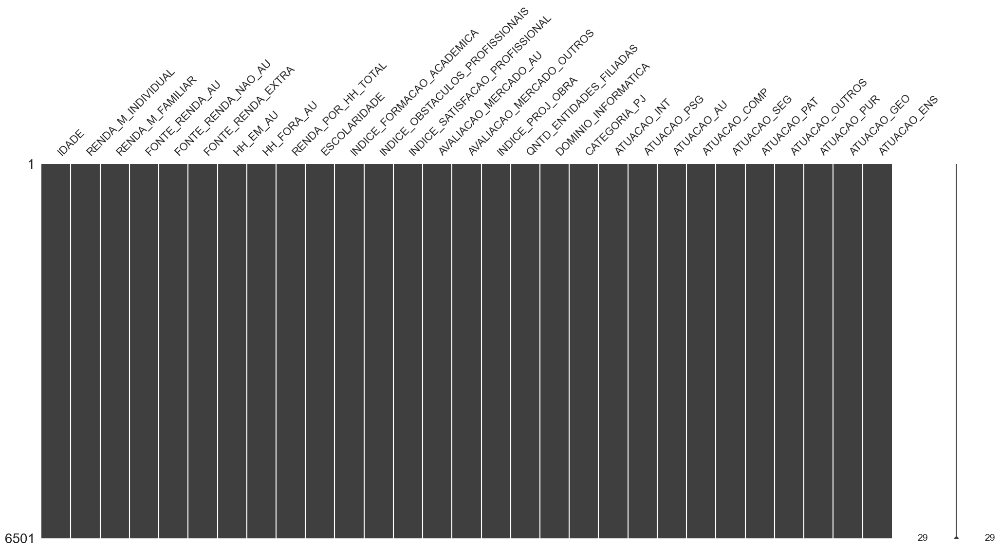

In [55]:
msno.matrix(features)

In [54]:
features.dropna(inplace=True)

In [ ]:
features.drop(
    labels=['INDICE_OBSTACULOS_PROFISSIONAIS','INDICE_SATISFACAO_PROFISSIONAL','AVALIACAO_MERCADO_AU','AVALIACAO_MERCADO_OUTROS','INDICE_PROJ_OBRA','HH_FORA_AU','RENDA_POR_HH_TOTAL'],
    axis=1, inplace=True)

In [56]:
features.info()

<class 'pandas.core.frame.DataFrame'>
Index: 6501 entries, 87 to 45379
Data columns (total 29 columns):
 #   Column                           Non-Null Count  Dtype  
---  ------                           --------------  -----  
 0   IDADE                            6501 non-null   float64
 1   RENDA_M_INDIVIDUAL               6501 non-null   float64
 2   RENDA_M_FAMILIAR                 6501 non-null   float64
 3   FONTE_RENDA_AU                   6501 non-null   float64
 4   FONTE_RENDA_NAO_AU               6501 non-null   float64
 5   FONTE_RENDA_EXTRA                6501 non-null   float64
 6   HH_EM_AU                         6501 non-null   float64
 7   HH_FORA_AU                       6501 non-null   float64
 8   RENDA_POR_HH_TOTAL               6501 non-null   float64
 9   ESCOLARIDADE                     6501 non-null   float64
 10  INDICE_FORMACAO_ACADEMICA        6501 non-null   float64
 11  INDICE_OBSTACULOS_PROFISSIONAIS  6501 non-null   float64
 12  INDICE_SATISFACAO_PROFI

In [ ]:
features = features.dropna(inplace=True)

In [ ]:
features = features.to_numpy()

In [ ]:
msno.matrix(features)

In [ ]:
features.describe()

In [57]:
array_features = features.to_numpy()

In [58]:
array_features.shape

(6501, 29)

In [63]:
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import MinMaxScaler
from sklearn.preprocessing import RobustScaler
scaler = StandardScaler()
#scaler = MinMaxScaler()
#scaler = RobustScaler()
scaled_features = scaler.fit_transform(array_features)

In [ ]:
from sklearn.pipeline import make_pipeline
estimator = make_pipeline(StandardScaler(), kmeans).fit(data)

An alternative standardization is scaling features to lie between a given minimum and maximum value, often between zero and one, or so that the maximum absolute value of each feature is scaled to unit size. This can be achieved using MinMaxScaler or MaxAbsScaler, respectively. The motivation to use this scaling include robustness to very small standard deviations of features and preserving zero entries in sparse data.

If your data contains many outliers, scaling using the mean and variance of the data is likely to not work very well. In these cases, you can use RobustScaler as a drop-in replacement instead. It uses more robust estimates for the center and range of your data.

It is sometimes not enough to center and scale the features independently, since a downstream model can further make some assumption on the linear independence of the features. To address this issue you can use PCA with whiten=True to further remove the linear correlation across features.

In [ ]:
scaled_features[:2]

# PCA

With the best line (linear combination) found, PCA gets the directions of its axes, called eigenvectors, and its linear coefficients, the eigenvalues. The combination of the eigenvectors and eigenvalues - or axes directions and coefficients - are the Principal Components of PCA. And that is when we can choose our number of dimensions based on the explained variance of each feature, by understanding which principal components we want to keep or discard based on how much variance they explain.

After obtaining the principal components, PCA uses the eigenvectors to form a vector of features that reorient the data from the original axes to the ones represented by the principal components - that's how the data dimensions are reduced.

PCA is a linear transformation, and linearity is sensitive to the scale of data. Therefore, PCA works best when all data values are on the same scale.

https://stackabuse.com/hierarchical-clustering-with-python-and-scikit-learn/

In [65]:
from sklearn.decomposition import PCA
pca = PCA(
    n_components=20, whiten=True,
)
pca_samples = pca.fit_transform(scaled_features)
#.transform(scaled_features)
print(
    '\n Total de variância explicada: {}'.format(pca.explained_variance_ratio_.sum()),'\n',
    'Explicação de variância por Componente Principal: {}'.format(pca.explained_variance_ratio_),
    '\n Variância de rúido: {}'.format(pca.noise_variance_)
    
)


 Total de variância explicada: 0.8457255672559953 
 Explicação de variância por Componente Principal: [0.10166841 0.07799771 0.06992922 0.05056115 0.04849179 0.04410195
 0.04119432 0.03944984 0.03634952 0.03584834 0.03564574 0.0334638
 0.03305816 0.03144277 0.03130054 0.02982493 0.02919288 0.02714491
 0.02491452 0.02414505] 
 Variância de rúido: 0.4971829834323837


In [66]:
ps = pd.DataFrame(pca_samples)
ps.head()

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19
0,-0.399886,-1.289873,-0.378655,-0.133311,-0.562950,-0.325901,-0.664124,-0.618137,-0.052412,-0.102433,-0.176121,0.509743,0.619769,-0.155809,0.100953,0.642157,0.504698,0.496252,-0.781995,-0.322107
1,2.631756,0.726509,-0.209028,-1.525151,-0.924873,-0.148785,0.663003,0.950733,-0.575392,1.119911,0.257242,0.750546,0.433933,-0.172829,-0.077690,0.337952,-0.732640,1.132232,-0.915506,-0.029921
2,-0.094746,-0.247956,0.047627,1.035782,-0.712207,-1.037953,-0.920865,-0.433050,1.536357,-1.247309,-1.359757,-0.845886,0.890017,-0.077535,0.657132,0.190777,-0.571137,2.136983,-0.157664,-1.513955
3,1.328874,2.067390,-0.943868,0.568314,1.151734,0.553447,0.206979,2.555592,0.886926,-0.913907,0.414574,-1.218843,-2.384666,-1.254985,1.201082,0.137937,-2.372575,1.342576,1.030892,-1.187427
4,-0.817026,-1.153877,-0.196634,-0.074511,-0.443624,1.551174,0.002176,-0.465529,1.103487,-0.277798,1.221930,0.618138,1.048161,0.218850,-1.890633,0.253792,-1.674857,0.795115,2.058825,0.382299


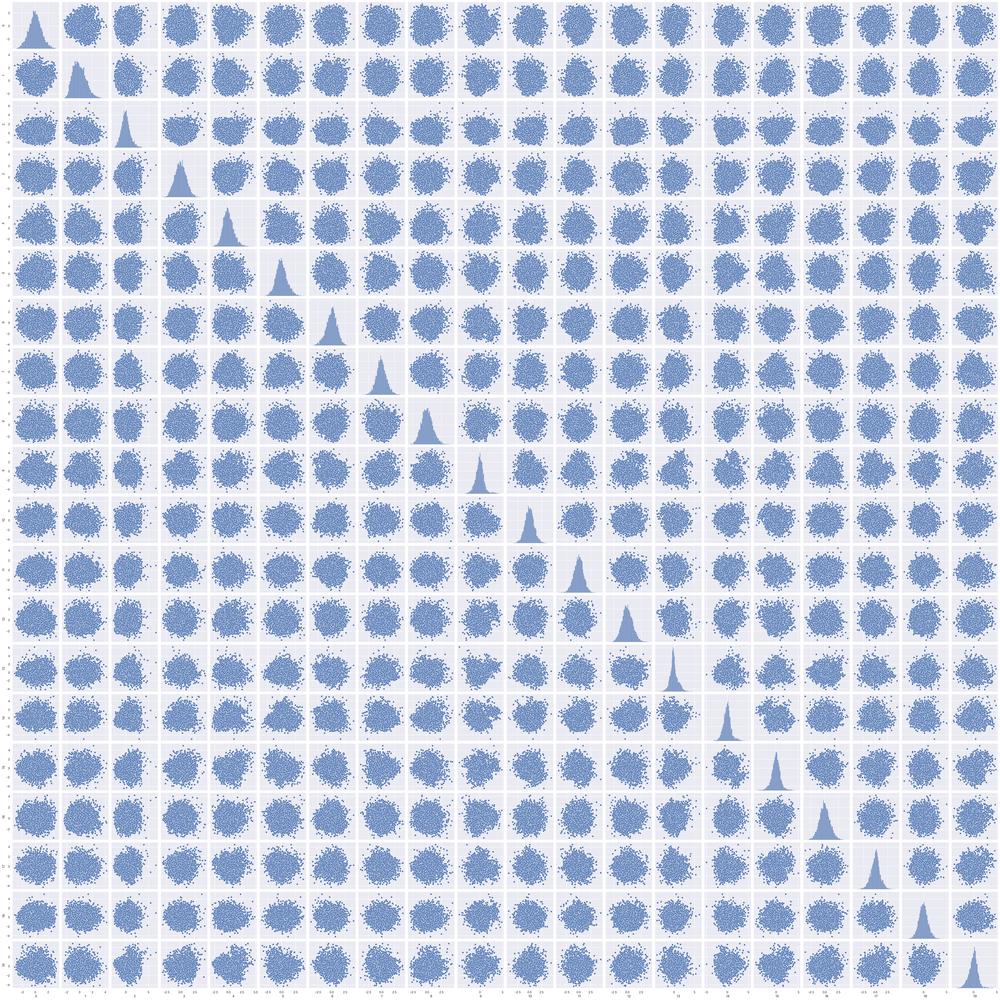

In [67]:
sns.pairplot(ps)

## Dendrograma

Notice that HCAs can be either divisive and top-down, or agglomerative and bottom-up. The top-down DHC approach works best when you have fewer, but larger clusters, hence it's more computationally expensive. On the other hand, the bottom-up AHC approach is fitted for when you have many smaller clusters. It is computationally simpler, more used, and more available.

# T-SNE

https://towardsdatascience.com/t-sne-clearly-explained-d84c537f53a

https://distill.pub/2016/misread-tsne/

https://builtin.com/data-science/tsne-python

In [68]:
from sklearn.manifold import TSNE
from tqdm import tqdm

perplexity_values = [2,3,5,10,25,50,75,100]
#perplexity_range = [5,25]
n_components=2
label_colunas_1 = []
label_colunas_2 = []

for n_perplexity in perplexity_values:
    for i in range(0,n_components):
        label_colunas_1.append(n_perplexity)
        label_colunas_2.append(i)

df_tsne= pd.DataFrame(columns=[label_colunas_1,label_colunas_2], dtype='float64')

for n_perplexity in tqdm(perplexity_values):
    tsne = TSNE(
        n_components=(n_components), verbose=0, perplexity=n_perplexity, n_iter=1000,
    )
    tsne_results = tsne.fit_transform(pca_samples)
    for i in range(0,n_components):
        df_tsne[n_perplexity, i] = tsne_results[:,(i-1)]

  0%|          | 0/8 [00:00<?, ?it/s]C:\Users\Bruno\anaconda3\lib\site-packages\sklearn\manifold\_t_sne.py:780: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
C:\Users\Bruno\anaconda3\lib\site-packages\sklearn\manifold\_t_sne.py:790: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(
 12%|█▎        | 1/8 [00:10<01:15, 10.82s/it]C:\Users\Bruno\anaconda3\lib\site-packages\sklearn\manifold\_t_sne.py:780: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
C:\Users\Bruno\anaconda3\lib\site-packages\sklearn\manifold\_t_sne.py:790: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(
 25%|██▌       | 2/8 [00:21<01:04, 10.81s/it]C:\Users\Bruno\anaconda3\lib\site-packages\sklearn\manifold\_t_sne.py:780: FutureWarning: The default initialization in TSNE will change fr

In [171]:
df_tsne

2                     3                     5               \
              0          1          0          1          0          1   
0     71.686935 -27.084768  81.065170  43.367687 -62.814571  71.093040   
1    -25.743458  73.775902 -80.728210  -4.101748 -41.902088 -31.667627   
2     37.181805 -74.294479  48.146057  88.925751  75.179604  39.169449   
3     29.032255 -29.899000   0.584943  55.229286  62.505791   9.826445   
4     89.632957  22.855415 -15.928990 -85.351730  32.122734 -54.205013   
...         ...        ...        ...        ...        ...        ...   
6496 -67.611176  70.594330 -74.028236 -59.104504  -0.213390 -76.230835   
6497 -19.622566  76.082077 -90.157166  -5.559734 -47.558594 -10.146882   
6498 -20.173954  31.280769 -28.276367  50.451118 -23.785990 -19.869164   
6499  54.896496 -26.283913  29.902937  61.434177  73.632332  -6.999465   
6500 -40.021770 -55.056007  64.788643 -15.662964  34.351536 -36.365623   

            10                    25                    50              \
              0          1          0          1          0          1   
0    -58.747261  66.044395  63.929008 -16.300631  15.092702 -60.319775   
1     29.238869  27.202774   7.963344 -66.632614  -9.250622 -36.899109   
2    -31.516802 -79.722046 -58.646088   8.505645 -20.263811  24.996206   
3     -1.044761 -58.651047 -49.476784 -32.987370  -7.906717   4.046074   
4    -49.441219 -42.612637  13.933932  37.214622  36.235813  35.528988   
...         ...        ...        ...        ...        ...        ...   
6496  89.689369  15.325251 -51.051926  51.625374  22.459236  58.446365   
6497  19.060259  25.338127  15.348605 -69.750992   8.491235 -30.193493   
6498  21.242180  16.522709   6.550877 -66.415833 -12.160721 -35.913746   
6499   7.912411 -71.456299 -58.456795  -9.450441 -15.446706  10.658318   
6500 -11.931758 -44.943478  -1.993030  13.940941  28.203264  19.491478   

            75                    100                   1    
              0          1          0          1             
0     21.983368 -37.793480  -2.597364  29.006870 -50.523586  
1     24.086782 -11.448982  -7.812068   7.020464 -33.774250  
2     16.099886  28.483454 -25.468439  17.767954  41.826939  
3     32.458065   7.606719 -29.065069  28.620373  15.419554  
4    -23.260202  13.639482   3.960979 -22.416208   8.646333  
...         ...        ...        ...        ...        ...  
6496 -40.420891  41.505703 -15.603513 -52.570393  79.109100  
6497  12.226872 -18.524435   8.638721   4.232471 -21.182249  
6498  25.068422 -12.292232   9.750728   5.059824 -24.828062  
6499  26.009741  25.977222  24.861969  -4.526206  31.521406  
6500  -9.257118  12.240504  11.303901 -28.157114 -10.802996  

[6501 rows x 17 columns]

In [70]:
perplexity_range = int(len(perplexity_values))
print(
    perplexity_range,
    n_components,
    len(df_tsne.columns.tolist())
)

8 2 16


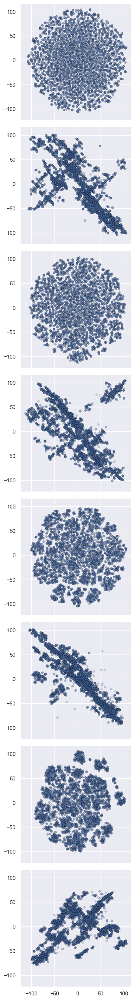

In [177]:
fig, axs = plt.subplots(
    nrows=perplexity_range, ncols=1,
    sharex=True, sharey=True, figsize=(4, ((perplexity_range/1.5)**2))
)
i = 0
while i < perplexity_range:
    x = df_tsne.iloc[:,i].array
    y = df_tsne.iloc[:,(i+1)].array
    axs[i].plot(x, y, 'bo', markersize=4, alpha=0.25, markeredgecolor='black', markeredgewidth=.5)
    i += 1
fig.tight_layout()
#fig.subplots_adjust(hspace=5.0)
plt.show()
#axs[0].plot(x,y)
#axs.set_title('Simple plot')

In [174]:
tsne = TSNE(
    n_components=2,
    verbose=1,
    perplexity=75,
    n_iter=10000
)
tsne_results = tsne.fit_transform(pca_samples)
for i in tqdm(range(1,n_components)):
    df_tsne[i] = tsne_results[:,(i-1)]

C:\Users\Bruno\anaconda3\lib\site-packages\sklearn\manifold\_t_sne.py:780: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
C:\Users\Bruno\anaconda3\lib\site-packages\sklearn\manifold\_t_sne.py:790: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(


[t-SNE] Computing 226 nearest neighbors...
[t-SNE] Indexed 6501 samples in 0.001s...
[t-SNE] Computed neighbors for 6501 samples in 0.758s...
[t-SNE] Computed conditional probabilities for sample 1000 / 6501
[t-SNE] Computed conditional probabilities for sample 2000 / 6501
[t-SNE] Computed conditional probabilities for sample 3000 / 6501
[t-SNE] Computed conditional probabilities for sample 4000 / 6501
[t-SNE] Computed conditional probabilities for sample 5000 / 6501
[t-SNE] Computed conditional probabilities for sample 6000 / 6501
[t-SNE] Computed conditional probabilities for sample 6501 / 6501
[t-SNE] Mean sigma: 1.407592
[t-SNE] KL divergence after 250 iterations with early exaggeration: 79.215248
[t-SNE] KL divergence after 10000 iterations: 1.737323


100%|██████████| 1/1 [00:00<?, ?it/s]


In [178]:
tsne_escolhido = pd.DataFrame(tsne_results)
tsne_escolhido

,0,1
0,71.026421,1.214284
1,38.642105,13.863877
2,-26.210445,5.220181
3,0.279358,-4.516531
4,-45.005470,40.878780
...,...,...
6496,-106.089874,-12.241790
6497,17.747995,0.140300
6498,38.786583,11.841693
6499,-11.119257,-2.035291


<AxesSubplot:xlabel='0', ylabel='1'>

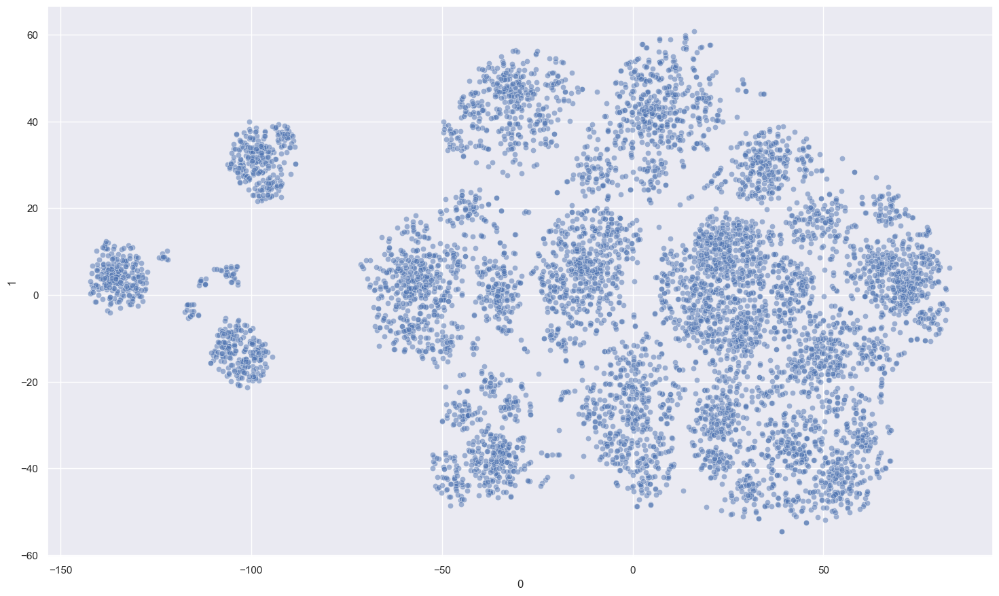

In [179]:
plt.figure(figsize=(16,10))
sns.scatterplot(
    data=tsne_escolhido,
    x=0, y=1,
    #hue="tsne-2d-three",
    #palette=sns.color_palette("hls", 10),
    legend="full",
    alpha=.5,
    #marker=markers
)

In [180]:
from sklearn_extra.cluster import KMedoids
kmedoids = KMedoids(
    n_clusters=8, random_state=None, max_iter=300,
    metric='euclidean', init='heuristic', method='alternate', #method='pam', 
).fit(pca_samples)
print(
    kmedoids.labels_,
    kmedoids.cluster_centers_,
    kmedoids.medoid_indices_,
    kmedoids.inertia_
)

[6 2 6 ... 1 2 1] [[-0.96192189 -0.07943549 -0.11907148 -0.65858163 -0.02113351  0.66929803
   0.47115229 -0.1452137  -0.41211237  0.93736013  0.36617024  0.11582443
  -0.30752423  0.06355205  0.04347149 -0.08889411 -0.16286569  0.41302219
   0.03908513 -0.20805821]
 [ 0.57114915 -0.60262959 -0.51192858  0.23371886 -0.86342002 -0.35255356
   0.522572    0.06634676 -0.50550185  0.43648013 -0.40595065  0.21767992
  -0.22913898 -0.33443893  0.21461971 -0.01415255  0.33570234  0.30217537
  -0.43776104  0.64860889]
 [ 0.08173193 -0.45453924 -0.49568519 -1.12638407  0.25596518  0.24414383
   0.40809896  0.30339659 -0.27498547  0.49282542 -0.1137582   0.36457242
  -0.09738169 -0.0772335   0.30332916  0.30193275 -0.01778956  0.1896557
  -0.64050992 -0.01389768]
 [-0.53129781 -0.99839812 -0.43057964 -0.9163706   0.39209159  0.00175977
   0.2519945   0.21986226 -0.36902153  0.12195451 -0.06908041  0.02993951
  -0.42270281 -0.17932152  0.40819846  0.22812552 -0.09144049  0.06042552
  -0.04477779 

## K-means

### Silhouette Analysis

NameError: name 'X' is not defined

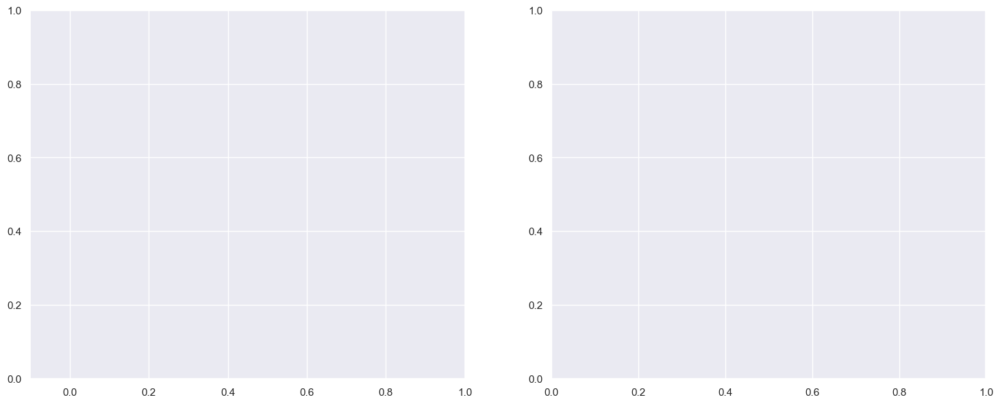

In [78]:
from sklearn.metrics import silhouette_samples, silhouette_score

import matplotlib.pyplot as plt
import matplotlib.cm as cm
import numpy as np

range_n_clusters = [2, 3, 4, 5, 6]
#range_n_clusters = range(2, 11)

for n_clusters in range_n_clusters:
    fig, (ax1, ax2) = plt.subplots(1, 2)
    fig.set_size_inches(18, 7)
    ax1.set_xlim([-0.1, 1])
    ax1.set_ylim([0, len(X) + (n_clusters + 1) * 10])
    
    kmeans = KMeans(n_clusters=n_clusters, n_init="auto").fit(pca_samples)
    cluster_labels = kmeans.predict

    # The silhouette_score gives the average value for all the samples.
    # This gives a perspective into the density and separation of the formed
    # clusters
    silhouette_avg = silhouette_score(pca_samples, cluster_labels)
    print(
        "For n_clusters =",
        n_clusters,
        "The average silhouette_score is :",
        silhouette_avg,
    )
    # Compute the silhouette scores for each sample
    sample_silhouette_values = silhouette_samples(X, cluster_labels)
    break

    y_lower = 10
    for i in range(n_clusters):
        # Aggregate the silhouette scores for samples belonging to
        # cluster i, and sort them
        ith_cluster_silhouette_values = sample_silhouette_values[cluster_labels == i]

        ith_cluster_silhouette_values.sort()

        size_cluster_i = ith_cluster_silhouette_values.shape[0]
        y_upper = y_lower + size_cluster_i

        color = cm.nipy_spectral(float(i) / n_clusters)
        ax1.fill_betweenx(
            np.arange(y_lower, y_upper),
            0,
            ith_cluster_silhouette_values,
            facecolor=color,
            edgecolor=color,
            alpha=0.7,
        )

        # Label the silhouette plots with their cluster numbers at the middle
        ax1.text(-0.05, y_lower + 0.5 * size_cluster_i, str(i))

        # Compute the new y_lower for next plot
        y_lower = y_upper + 10  # 10 for the 0 samples

    ax1.set_title("The silhouette plot for the various clusters.")
    ax1.set_xlabel("The silhouette coefficient values")
    ax1.set_ylabel("Cluster label")

    # The vertical line for average silhouette score of all the values
    ax1.axvline(x=silhouette_avg, color="red", linestyle="--")

    ax1.set_yticks([])  # Clear the yaxis labels / ticks
    ax1.set_xticks([-0.1, 0, 0.2, 0.4, 0.6, 0.8, 1])

    # 2nd Plot showing the actual clusters formed
    colors = cm.nipy_spectral(cluster_labels.astype(float) / n_clusters)
    ax2.scatter(
        X[:, 0], X[:, 1], marker=".", s=30, lw=0, alpha=0.7, c=colors, edgecolor="k"
    )

    # Labeling the clusters
    centers = clusterer.cluster_centers_
    # Draw white circles at cluster centers
    ax2.scatter(
        centers[:, 0],
        centers[:, 1],
        marker="o",
        c="white",
        alpha=1,
        s=200,
        edgecolor="k",
    )

    for i, c in enumerate(centers):
        ax2.scatter(c[0], c[1], marker="$%d$" % i, alpha=1, s=50, edgecolor="k")

    ax2.set_title("The visualization of the clustered data.")
    ax2.set_xlabel("Feature space for the 1st feature")
    ax2.set_ylabel("Feature space for the 2nd feature")

    plt.suptitle(
        "Silhouette analysis for KMeans clustering on sample data with n_clusters = %d"
        % n_clusters,
        fontsize=14,
        fontweight="bold",
    )

plt.show()

In [102]:
import matplotlib.pyplot as plt
from kneed import KneeLocator
from sklearn.datasets import make_blobs
from sklearn import metrics
from sklearn.metrics import silhouette_score
from sklearn.cluster import DBSCAN
from sklearn.cluster import KMeans
from sklearn.mixture import GaussianMixture
from sklearn_extra.cluster import KMedoids

In [95]:
clusterer = KMeans(n_clusters=5,random_state=42).fit(tocluster)

centers = clusterer.cluster_centers_
c_preds = clusterer.predict(tocluster)
print(centers)

NameError: name 'tocluster' is not defined

In [81]:
clustering_metrics = [
    metrics.homogeneity_score,
    metrics.silhouette_score
    metrics.completeness_score,
    metrics.v_measure_score,
    metrics.adjusted_rand_score,
    metrics.adjusted_mutual_info_score,
]

SyntaxError: invalid syntax (3764179860.py, line 5)

In [96]:
print (c_preds[0:100])

NameError: name 'c_preds' is not defined

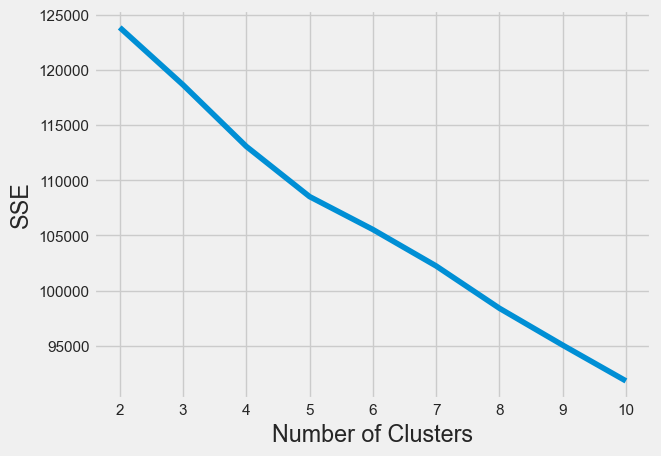

In [97]:
kmeans_kwargs = {
   "init": "random",
   "n_init": 10,
   "max_iter": 300,
   #"random_state": 42,
    "algorithm": "elkan"
   }
sse = []
for k in range(2, 11):
    kmeans = KMeans(n_clusters=k, **kmeans_kwargs)
    kmeans.fit(pca_samples)
    #kmeans.fit(scaled_features)
    sse.append(kmeans.inertia_)
plt.style.use("fivethirtyeight")
plt.plot(range(2, 11), sse)
plt.xticks(range(2, 11))
plt.xlabel("Number of Clusters")
plt.ylabel("SSE")
plt.show()

In [101]:
kl = KneeLocator(
   range(2, 11), sse, curve="convex", direction="decreasing"
   )

kl.elbow

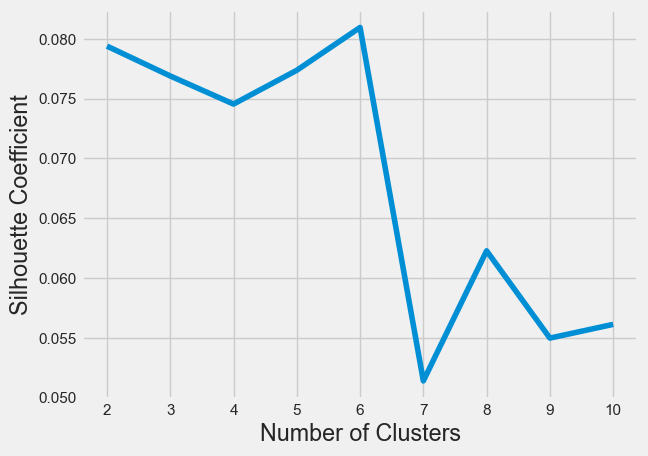

In [85]:
silhouette_coefficients = []
for k in range(2, 11):
   kmeans = KMeans(n_clusters=k, **kmeans_kwargs)
   kmeans.fit(scaled_features)
   score = silhouette_score(scaled_features, kmeans.labels_)
   silhouette_coefficients.append(score)
plt.style.use("fivethirtyeight")
plt.plot(range(2, 11), silhouette_coefficients)
plt.xticks(range(2, 11))
plt.xlabel("Number of Clusters")
plt.ylabel("Silhouette Coefficient")
plt.show()

In [103]:
kmeans = KMeans(
    algorithm="elkan",
    init="random",
    n_clusters=8,
    n_init=30,
    max_iter=1000,
   )

In [335]:
kmedoids = KMedoids(
    n_clusters=12, random_state=None, max_iter=300,
    metric='euclidean', init='heuristic', method='pam', 
    #method='alternate', 
)

In [336]:
#clusterer = kmeans
clusterer = kmedoids

clusterer.fit(pca_samples)
labels = clusterer.labels_
#centroids = clusterer.cluster_centers_

tsne_escolhido['labels'] = labels
n_clusters_ = len(set(labels)) - (1 if -1 in labels else 0)
n_noise_ = list(labels).count(-1)

print("Estimated number of clusters: %d" % n_clusters_)
print("Estimated number of noise points: %d" % n_noise_)

Estimated number of clusters: 12
Estimated number of noise points: 0


GM / DBSCAN

In [325]:
dbscan = DBSCAN(
    #eps=1, min_samples=3,
    eps=3.5, min_samples=4,
    metric='cityblock', metric_params=None, algorithm='auto',
    #metric{cityblock’, ‘cosine’, ‘euclidean’, ‘l1’, ‘l2’, ‘manhattan'}
    #algorithm{‘auto’, ‘ball_tree’, ‘kd_tree’, ‘brute’}
    
)
clusterer = dbscan
clusterer.fit(pca_samples)
labels = clusterer.labels_
tsne_escolhido['labels'] = labels
n_clusters_ = len(set(labels)) - (1 if -1 in labels else 0)
n_noise_ = list(labels).count(-1)

print("Estimated number of clusters: %d" % n_clusters_)
print("Estimated number of noise points: %d" % n_noise_)

Estimated number of clusters: 15
Estimated number of noise points: 6375


In [346]:
gm = GaussianMixture(
    n_components=15,
    covariance_type='spherical',
    max_iter=200,
    verbose=0,
    init_params='kmeans',
    n_init=50,
    warm_start=True
)
gm.fit(pca_samples)
labels = gm.predict(pca_samples)
tsne_escolhido['labels'] = labels

In [352]:
from sklearn.mixture import BayesianGaussianMixture
bgm = BayesianGaussianMixture(
    n_components=15,
    #covariance_type='spherical',
    verbose=1,
    n_init=50,
    warm_start=True
).fit(pca_samples)
labels = bgm.predict(pca_samples)
tsne_escolhido['labels'] = labels

Initialization 0
  Iteration 10
  Iteration 20
  Iteration 30
  Iteration 40
Initialization converged: True
Initialization 1
  Iteration 10
  Iteration 20
Initialization converged: True
Initialization 2
  Iteration 10
  Iteration 20
  Iteration 30
  Iteration 40
  Iteration 50
  Iteration 60
Initialization converged: True
Initialization 3
  Iteration 10
  Iteration 20
  Iteration 30
  Iteration 40
Initialization converged: True
Initialization 4
  Iteration 10
  Iteration 20
  Iteration 30
  Iteration 40
Initialization converged: True
Initialization 5
  Iteration 10
  Iteration 20
  Iteration 30
  Iteration 40
  Iteration 50
  Iteration 60
  Iteration 70
  Iteration 80
  Iteration 90
  Iteration 100
Initialization converged: True
Initialization 6
  Iteration 10
  Iteration 20
  Iteration 30
Initialization converged: True
Initialization 7
  Iteration 10
  Iteration 20
  Iteration 30
  Iteration 40
  Iteration 50
  Iteration 60
Initialization converged: True
Initialization 8
  Iteration 1

In [227]:
print(
    gm.covariances_,
    gm.precisions_,
    gm.n_iter_
)

[0.79703951 0.43367226 0.61807382 0.2742873  0.67965559 0.7159839
 0.26016012 0.67287241 0.82386537 0.5799991  0.77670357 1.05012061
 1.28499861 0.49169099 0.91309648] [1.25464295 2.30588879 1.61792972 3.6458122  1.47133343 1.39667945
 3.84378668 1.48616586 1.21379055 1.7241406  1.28749248 0.95227157
 0.77821096 2.0337977  1.09517452] 32


<AxesSubplot:xlabel='0', ylabel='1'>

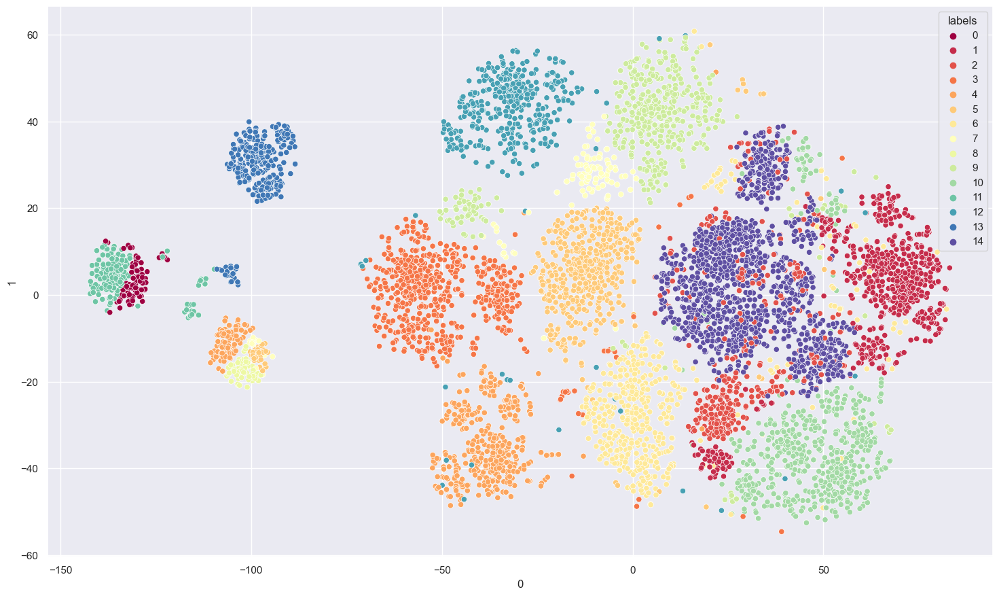

In [353]:
plt.figure(figsize=(16,10))
sns.set_theme(style="darkgrid")
sns.scatterplot(
    data=tsne_escolhido,
    x=0, y=1,
    hue="labels",
    palette='Spectral',
    #palette="ch:r=-.5,l=.75",
    #palette=sns.color_palette("hls", 10),
    legend="full",
    alpha=1,
    #marker=markers
)

In [168]:
print(
    #kmedoids.medoid_indices_,
    #kmeans.cluster_centers_,
    #clusterer.n_iter_,
    #clusterer.inertia_,
)

Inertia is not a normalized metric. The lower values of inertia are better and zero is optimal, but in very high-dimensional spaces, euclidean distances tend to become inflated (this is an instance of curse of dimensionality).

Running a dimensionality reduction algorithm such as PCA prior to k-means clustering can alleviate this problem and speed up the computations.

In [169]:
print(f"Homogeneity: {metrics.homogeneity_score(labels_true, labels):.3f}")
print(f"Completeness: {metrics.completeness_score(labels_true, labels):.3f}")
print(f"V-measure: {metrics.v_measure_score(labels_true, labels):.3f}")
print(f"Adjusted Rand Index: {metrics.adjusted_rand_score(labels_true, labels):.3f}")
print(
    "Adjusted Mutual Information:"
    f" {metrics.adjusted_mutual_info_score(labels_true, labels):.3f}"
)
print(f"Silhouette Coefficient: {metrics.silhouette_score(X, labels):.3f}")

NameError: name 'labels_true' is not defined